In [68]:
import numpy as np
from datetime import date
from pandas_profiling import ProfileReport
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
import pingouin

In [66]:
!pip install pingouin

In [67]:
!pip install pandas-profiling

## 2018-2021 SNAP Numerical Data (NYC)

In [5]:
snap_population = pd.read_csv("Borough_Community_District_Report_-_SNAP_Population-6.csv")
snap_population

,Month,Boro,CD,BC_SNAP_Recipients,BC_SNAP_Households
0,09/01/2020,Manhattan,M01,2276,1799
1,09/01/2020,Manhattan,M02,2994,2438
2,09/01/2020,Manhattan,M03,37879,26041
3,09/01/2020,Manhattan,M04,13035,9802
4,09/01/2020,Manhattan,M05,6159,4317
...,...,...,...,...,...
644,03/01/2021,Queens,Q13,22504,14033
645,03/01/2021,Queens,Q14,30355,16584
646,03/01/2021,Staten Island,S01,38964,20751
647,03/01/2021,Staten Island,S02,15985,9256


In [6]:
snap_population.rename(columns = {'Boro':'Borough'}, inplace = True)
snap_population

,Month,Borough,CD,BC_SNAP_Recipients,BC_SNAP_Households
0,09/01/2020,Manhattan,M01,2276,1799
1,09/01/2020,Manhattan,M02,2994,2438
2,09/01/2020,Manhattan,M03,37879,26041
3,09/01/2020,Manhattan,M04,13035,9802
4,09/01/2020,Manhattan,M05,6159,4317
...,...,...,...,...,...
644,03/01/2021,Queens,Q13,22504,14033
645,03/01/2021,Queens,Q14,30355,16584
646,03/01/2021,Staten Island,S01,38964,20751
647,03/01/2021,Staten Island,S02,15985,9256


In [7]:
snap_population['Borough'] = snap_population['Borough'].str.upper()

snap_population.head()

,Month,Borough,CD,BC_SNAP_Recipients,BC_SNAP_Households
0,09/01/2020,MANHATTAN,M01,2276,1799
1,09/01/2020,MANHATTAN,M02,2994,2438
2,09/01/2020,MANHATTAN,M03,37879,26041
3,09/01/2020,MANHATTAN,M04,13035,9802
4,09/01/2020,MANHATTAN,M05,6159,4317


In [8]:
snap_population.dropna(axis=1, how= 'all')

,Month,Borough,CD,BC_SNAP_Recipients,BC_SNAP_Households
0,09/01/2020,MANHATTAN,M01,2276,1799
1,09/01/2020,MANHATTAN,M02,2994,2438
2,09/01/2020,MANHATTAN,M03,37879,26041
3,09/01/2020,MANHATTAN,M04,13035,9802
4,09/01/2020,MANHATTAN,M05,6159,4317
...,...,...,...,...,...
644,03/01/2021,QUEENS,Q13,22504,14033
645,03/01/2021,QUEENS,Q14,30355,16584
646,03/01/2021,STATEN ISLAND,S01,38964,20751
647,03/01/2021,STATEN ISLAND,S02,15985,9256


In [9]:
snap_population.drop_duplicates(inplace=True)

In [10]:
snap_population.rename(columns = {'BC_SNAP_Recipients':'Individuals Receiving SNAP Benefits'}, inplace = True)
snap_population

,Month,Borough,CD,Individuals Receiving SNAP Benefits,BC_SNAP_Households
0,09/01/2020,MANHATTAN,M01,2276,1799
1,09/01/2020,MANHATTAN,M02,2994,2438
2,09/01/2020,MANHATTAN,M03,37879,26041
3,09/01/2020,MANHATTAN,M04,13035,9802
4,09/01/2020,MANHATTAN,M05,6159,4317
...,...,...,...,...,...
644,03/01/2021,QUEENS,Q13,22504,14033
645,03/01/2021,QUEENS,Q14,30355,16584
646,03/01/2021,STATEN ISLAND,S01,38964,20751
647,03/01/2021,STATEN ISLAND,S02,15985,9256


In [11]:
snap_population.rename(columns = {'BC_SNAP_Households':'Households Receiving SNAP Benefits'}, inplace = True)
snap_population

,Month,Borough,CD,Individuals Receiving SNAP Benefits,Households Receiving SNAP Benefits
0,09/01/2020,MANHATTAN,M01,2276,1799
1,09/01/2020,MANHATTAN,M02,2994,2438
2,09/01/2020,MANHATTAN,M03,37879,26041
3,09/01/2020,MANHATTAN,M04,13035,9802
4,09/01/2020,MANHATTAN,M05,6159,4317
...,...,...,...,...,...
644,03/01/2021,QUEENS,Q13,22504,14033
645,03/01/2021,QUEENS,Q14,30355,16584
646,03/01/2021,STATEN ISLAND,S01,38964,20751
647,03/01/2021,STATEN ISLAND,S02,15985,9256


In [12]:
snap_population.rename(columns = {'CD':'Community District'}, inplace = True)
snap_population

,Month,Borough,Community District,Individuals Receiving SNAP Benefits,Households Receiving SNAP Benefits
0,09/01/2020,MANHATTAN,M01,2276,1799
1,09/01/2020,MANHATTAN,M02,2994,2438
2,09/01/2020,MANHATTAN,M03,37879,26041
3,09/01/2020,MANHATTAN,M04,13035,9802
4,09/01/2020,MANHATTAN,M05,6159,4317
...,...,...,...,...,...
644,03/01/2021,QUEENS,Q13,22504,14033
645,03/01/2021,QUEENS,Q14,30355,16584
646,03/01/2021,STATEN ISLAND,S01,38964,20751
647,03/01/2021,STATEN ISLAND,S02,15985,9256


In [13]:
snap_population.rename(columns = {'Month':'First Day of the Report Month'}, inplace = True)
snap_population

,First Day of the Report Month,Borough,Community District,Individuals Receiving SNAP Benefits,Households Receiving SNAP Benefits
0,09/01/2020,MANHATTAN,M01,2276,1799
1,09/01/2020,MANHATTAN,M02,2994,2438
2,09/01/2020,MANHATTAN,M03,37879,26041
3,09/01/2020,MANHATTAN,M04,13035,9802
4,09/01/2020,MANHATTAN,M05,6159,4317
...,...,...,...,...,...
644,03/01/2021,QUEENS,Q13,22504,14033
645,03/01/2021,QUEENS,Q14,30355,16584
646,03/01/2021,STATEN ISLAND,S01,38964,20751
647,03/01/2021,STATEN ISLAND,S02,15985,9256


In [14]:
snap_population.columns

Index(['First Day of the Report Month', 'Borough', 'Community District',
       'Individuals Receiving SNAP Benefits',
       'Households Receiving SNAP Benefits'],
      dtype='object')

In [15]:
snap_population['First Day of the Report Month'] = snap_population['First Day of the Report Month'].str.strip()
snap_population.drop(snap_population[snap_population['First Day of the Report Month'] == '09/01/2018'].index, inplace = True)

In [16]:
snap_population['First Day of the Report Month'] = snap_population['First Day of the Report Month'].str.strip()
snap_population.drop(snap_population[snap_population['First Day of the Report Month'] == '12/01/2018'].index, inplace = True)

In [17]:
snap_population['First Day of the Report Month']= pd.to_datetime(snap_population['First Day of the Report Month'])
snap_population

,First Day of the Report Month,Borough,Community District,Individuals Receiving SNAP Benefits,Households Receiving SNAP Benefits
0,2020-09-01,MANHATTAN,M01,2276,1799
1,2020-09-01,MANHATTAN,M02,2994,2438
2,2020-09-01,MANHATTAN,M03,37879,26041
3,2020-09-01,MANHATTAN,M04,13035,9802
4,2020-09-01,MANHATTAN,M05,6159,4317
...,...,...,...,...,...
644,2021-03-01,QUEENS,Q13,22504,14033
645,2021-03-01,QUEENS,Q14,30355,16584
646,2021-03-01,STATEN ISLAND,S01,38964,20751
647,2021-03-01,STATEN ISLAND,S02,15985,9256


In [18]:
snap_population.columns

Index(['First Day of the Report Month', 'Borough', 'Community District',
       'Individuals Receiving SNAP Benefits',
       'Households Receiving SNAP Benefits'],
      dtype='object')

In [19]:
snap_population

,First Day of the Report Month,Borough,Community District,Individuals Receiving SNAP Benefits,Households Receiving SNAP Benefits
0,2020-09-01,MANHATTAN,M01,2276,1799
1,2020-09-01,MANHATTAN,M02,2994,2438
2,2020-09-01,MANHATTAN,M03,37879,26041
3,2020-09-01,MANHATTAN,M04,13035,9802
4,2020-09-01,MANHATTAN,M05,6159,4317
...,...,...,...,...,...
644,2021-03-01,QUEENS,Q13,22504,14033
645,2021-03-01,QUEENS,Q14,30355,16584
646,2021-03-01,STATEN ISLAND,S01,38964,20751
647,2021-03-01,STATEN ISLAND,S02,15985,9256


In [20]:
snap_population.nunique()

First Day of the Report Month            9
Borough                                  5
Community District                      59
Individuals Receiving SNAP Benefits    528
Households Receiving SNAP Benefits     526
dtype: int64

In [21]:
snap_population

,First Day of the Report Month,Borough,Community District,Individuals Receiving SNAP Benefits,Households Receiving SNAP Benefits
0,2020-09-01,MANHATTAN,M01,2276,1799
1,2020-09-01,MANHATTAN,M02,2994,2438
2,2020-09-01,MANHATTAN,M03,37879,26041
3,2020-09-01,MANHATTAN,M04,13035,9802
4,2020-09-01,MANHATTAN,M05,6159,4317
...,...,...,...,...,...
644,2021-03-01,QUEENS,Q13,22504,14033
645,2021-03-01,QUEENS,Q14,30355,16584
646,2021-03-01,STATEN ISLAND,S01,38964,20751
647,2021-03-01,STATEN ISLAND,S02,15985,9256


In [22]:
snap_population.tail()

,First Day of the Report Month,Borough,Community District,Individuals Receiving SNAP Benefits,Households Receiving SNAP Benefits
644,2021-03-01,QUEENS,Q13,22504,14033
645,2021-03-01,QUEENS,Q14,30355,16584
646,2021-03-01,STATEN ISLAND,S01,38964,20751
647,2021-03-01,STATEN ISLAND,S02,15985,9256
648,2021-03-01,STATEN ISLAND,S03,11368,7085


In [23]:
snap_population.head()

,First Day of the Report Month,Borough,Community District,Individuals Receiving SNAP Benefits,Households Receiving SNAP Benefits
0,2020-09-01,MANHATTAN,M01,2276,1799
1,2020-09-01,MANHATTAN,M02,2994,2438
2,2020-09-01,MANHATTAN,M03,37879,26041
3,2020-09-01,MANHATTAN,M04,13035,9802
4,2020-09-01,MANHATTAN,M05,6159,4317


In [24]:
snap_population['Borough'].value_counts()

BROOKLYN         162
QUEENS           126
MANHATTAN        108
BRONX            108
STATEN ISLAND     27
Name: Borough, dtype: int64

In [25]:
snap_population.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 531 entries, 0 to 648
Data columns (total 5 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   First Day of the Report Month        531 non-null    datetime64[ns]
 1   Borough                              531 non-null    object        
 2   Community District                   531 non-null    object        
 3   Individuals Receiving SNAP Benefits  531 non-null    int64         
 4   Households Receiving SNAP Benefits   531 non-null    int64         
dtypes: datetime64[ns](1), int64(2), object(2)
memory usage: 24.9+ KB


In [26]:
snap_population.describe()

,Individuals Receiving SNAP Benefits,Households Receiving SNAP Benefits
count,531.000000,531.000000
mean,26816.442561,15697.097928
std,15027.901879,7910.158922
min,2163.000000,1682.000000
25%,15973.000000,9842.500000
50%,23776.000000,14304.000000
75%,37841.000000,21071.500000
max,67886.000000,39365.000000


In [27]:
correlation=snap_population.corr()

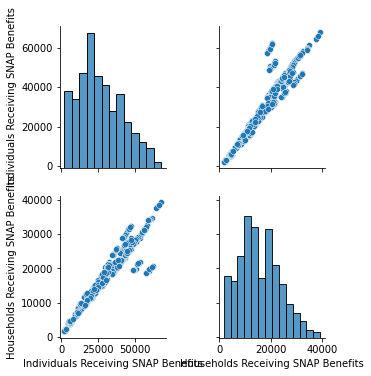

In [28]:
sns.pairplot(snap_population)

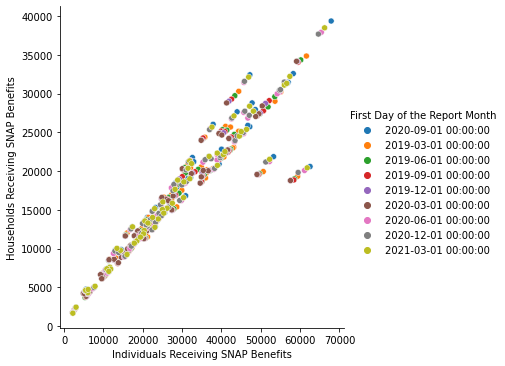

In [29]:
sns.relplot(x='Individuals Receiving SNAP Benefits',y='Households Receiving SNAP Benefits',hue='First Day of the Report Month', data=snap_population )

In [30]:
snap_population.describe()

,Individuals Receiving SNAP Benefits,Households Receiving SNAP Benefits
count,531.000000,531.000000
mean,26816.442561,15697.097928
std,15027.901879,7910.158922
min,2163.000000,1682.000000
25%,15973.000000,9842.500000
50%,23776.000000,14304.000000
75%,37841.000000,21071.500000
max,67886.000000,39365.000000


<AxesSubplot:>

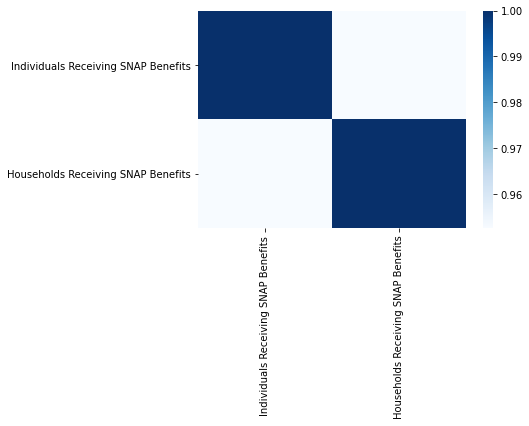

In [31]:
plt.figure(figsize=(6,4))
sns.heatmap(snap_population.corr(),cmap='Blues',annot=False) 

<AxesSubplot:>

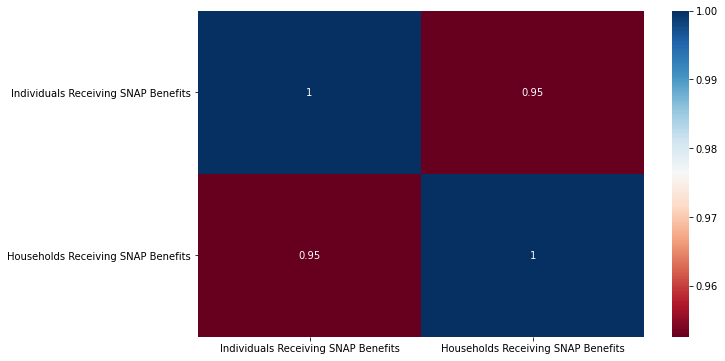

In [32]:

k = 2#number of variables for heatmap
cols = snap_population.corr().nlargest(k, 'Individuals Receiving SNAP Benefits')['Individuals Receiving SNAP Benefits'].index
cm = snap_population[cols].corr()
plt.figure(figsize=(10,6))
sns.heatmap(cm, annot=True, cmap = 'RdBu')

In [33]:
storm_nyc = snap_population.groupby(["Borough", "First Day of the Report Month"])[["Individuals Receiving SNAP Benefits"]].mean()
print(storm_nyc)

                                             Individuals Receiving SNAP Benefits
Borough       First Day of the Report Month                                     
BRONX         2019-03-01                                            36557.666667
              2019-06-01                                            35753.083333
              2019-09-01                                            35229.333333
              2019-12-01                                            34936.666667
              2020-03-01                                            34771.250000
              2020-06-01                                            38627.833333
              2020-09-01                                            40193.833333
              2020-12-01                                            38890.916667
              2021-03-01                                            39859.916667
BROOKLYN      2019-03-01                                            30797.277778
              2019-06-01    

Text(0.5, 1.0, 'SNAP Numerical Data (The Bronx)')

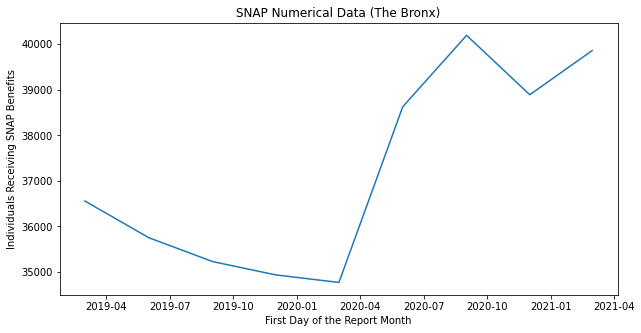

In [34]:
NYC_snap_population = storm_nyc.query("Borough == 'BRONX'")
fig = plt.figure(figsize=(10,5))
seaborn = sns.lineplot(data=NYC_snap_population, x="First Day of the Report Month", y="Individuals Receiving SNAP Benefits")
seaborn.set_title("SNAP Numerical Data (The Bronx)")

Text(0.5, 1.0, 'SNAP Numerical Data (Manhattan)')

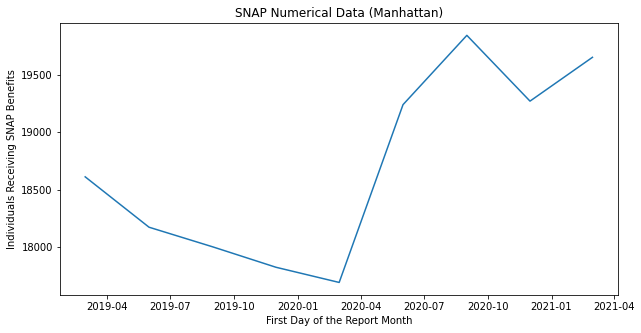

In [35]:
NYC_snap_population = storm_nyc.query("Borough == 'MANHATTAN'")
fig = plt.figure(figsize=(10,5))
seaborn = sns.lineplot(data=NYC_snap_population, x="First Day of the Report Month", y="Individuals Receiving SNAP Benefits")
seaborn.set_title("SNAP Numerical Data (Manhattan)")

Text(0.5, 1.0, 'SNAP Numerical Data (Queens)')

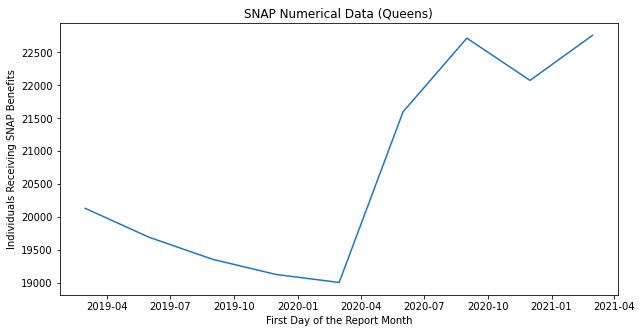

In [36]:
NYC_snap_population = storm_nyc.query("Borough == 'QUEENS'")
fig = plt.figure(figsize=(10,5))
seaborn = sns.lineplot(data=NYC_snap_population, x="First Day of the Report Month", y="Individuals Receiving SNAP Benefits")
seaborn.set_title("SNAP Numerical Data (Queens)")

Text(0.5, 1.0, 'SNAP Numerical Data (Brooklyn)')

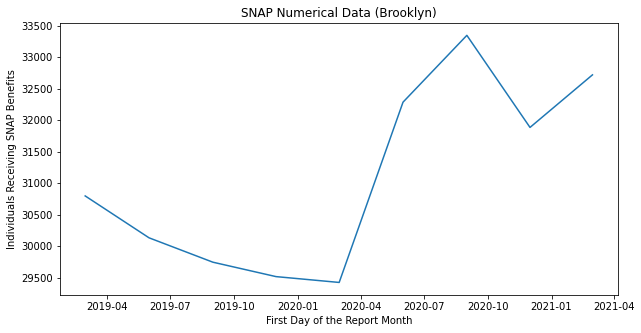

In [37]:
NYC_snap_population = storm_nyc.query("Borough == 'BROOKLYN'")
fig = plt.figure(figsize=(10,5))
seaborn = sns.lineplot(data=NYC_snap_population, x="First Day of the Report Month", y="Individuals Receiving SNAP Benefits")
seaborn.set_title("SNAP Numerical Data (Brooklyn)")

Text(0.5, 1.0, 'SNAP Numerical Data (Staten Island)')

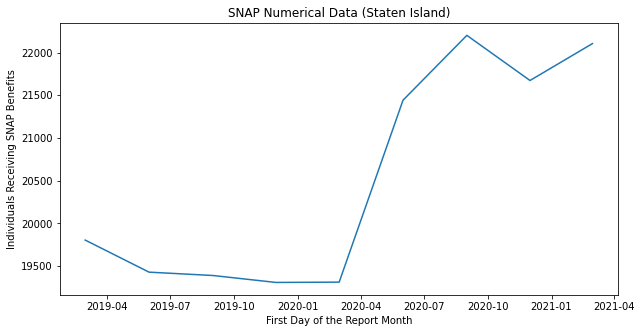

In [38]:
SI_snap_population = storm_nyc.query("Borough == 'STATEN ISLAND'")
fig = plt.figure(figsize=(10,5))
seaborn = sns.lineplot(data=SI_snap_population, x="First Day of the Report Month", y="Individuals Receiving SNAP Benefits")
seaborn.set_title("SNAP Numerical Data (Staten Island)")

In [39]:
storms = storm_nyc.value_counts().head(10)
print(storms)

Individuals Receiving SNAP Benefits
17689.166667                           1
22105.666667                           1
22717.857143                           1
22760.285714                           1
29424.833333                           1
29517.388889                           1
29746.166667                           1
30132.833333                           1
30797.277778                           1
31884.055556                           1
dtype: int64


In [40]:
snap_population

,First Day of the Report Month,Borough,Community District,Individuals Receiving SNAP Benefits,Households Receiving SNAP Benefits
0,2020-09-01,MANHATTAN,M01,2276,1799
1,2020-09-01,MANHATTAN,M02,2994,2438
2,2020-09-01,MANHATTAN,M03,37879,26041
3,2020-09-01,MANHATTAN,M04,13035,9802
4,2020-09-01,MANHATTAN,M05,6159,4317
...,...,...,...,...,...
644,2021-03-01,QUEENS,Q13,22504,14033
645,2021-03-01,QUEENS,Q14,30355,16584
646,2021-03-01,STATEN ISLAND,S01,38964,20751
647,2021-03-01,STATEN ISLAND,S02,15985,9256


In [41]:
#assigning population

conditions = [(snap_population['Borough']=='BRONX') & ((snap_population['First Day of the Report Month']=='2019-03-01')),
              (snap_population['Borough']=='BRONX') & ((snap_population['First Day of the Report Month']=='2019-06-01')),
              (snap_population['Borough']=='BRONX') & ((snap_population['First Day of the Report Month']=='2019-09-01')),
              (snap_population['Borough']=='BRONX') & ((snap_population['First Day of the Report Month']=='2019-12-01')),
              (snap_population['Borough']=='BRONX')& ((snap_population['First Day of the Report Month']=='2020-03-01')),
              (snap_population['Borough']=='BRONX')& ((snap_population['First Day of the Report Month']=='2020-06-01')),
              (snap_population['Borough']=='BRONX')& ((snap_population['First Day of the Report Month']=='2020-09-01')),
              (snap_population['Borough']=='BRONX')& ((snap_population['First Day of the Report Month']=='2020-12-01')),
              (snap_population['Borough']=='BRONX')& ((snap_population['First Day of the Report Month']=='2021-03-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2019-03-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2019-06-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2019-09-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2019-12-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2020-03-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2020-06-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2020-09-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2020-12-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2021-03-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2019-03-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2019-06-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2019-09-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2019-12-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2020-03-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2020-06-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2020-09-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2020-12-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2021-03-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2019-03-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2019-06-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2019-09-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2019-12-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2020-03-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2020-06-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2020-09-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2020-12-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2021-03-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2019-03-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2019-06-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2019-09-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2019-12-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2020-03-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2020-06-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2020-09-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2020-12-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2021-03-01'))]

In [42]:
# create a list of the values we want to assign for each condition
values = [#the bronx
    1418210,1418210,1418210,1418210,1404330,1404330,1404330,1404330,1390450,
#brooklyn
2559900,2559900,2559900,2559900, 2541730,2541730,2541730,2541730,2523560,
#manhattan
1628710,1628710,1628710,1628710,1628360,1628360,1628360,1628360,1628010,
#queens
2253860,2253860,2253860,2253860,2233110,2233110,2233110,2233110,2212360,
#staten island
476143,476143,476143,476143,476026,476026,476026,476026,475909]

# create a new column and use np.select to assign values to it using our lists as arguments
snap_population['population'] = np.select(conditions, values)

In [43]:
snap_population

,First Day of the Report Month,Borough,Community District,Individuals Receiving SNAP Benefits,Households Receiving SNAP Benefits,population
0,2020-09-01,MANHATTAN,M01,2276,1799,1628360
1,2020-09-01,MANHATTAN,M02,2994,2438,1628360
2,2020-09-01,MANHATTAN,M03,37879,26041,1628360
3,2020-09-01,MANHATTAN,M04,13035,9802,1628360
4,2020-09-01,MANHATTAN,M05,6159,4317,1628360
...,...,...,...,...,...,...
644,2021-03-01,QUEENS,Q13,22504,14033,2212360
645,2021-03-01,QUEENS,Q14,30355,16584,2212360
646,2021-03-01,STATEN ISLAND,S01,38964,20751,475909
647,2021-03-01,STATEN ISLAND,S02,15985,9256,475909


In [44]:
print(newyorkcity)

NameError: name 'newyorkcity' is not defined

In [45]:
#assigning mean population
conditions = [(snap_population['Borough']=='BRONX') & ((snap_population['First Day of the Report Month']=='2019-03-01')),
              (snap_population['Borough']=='BRONX') & ((snap_population['First Day of the Report Month']=='2019-06-01')),
              (snap_population['Borough']=='BRONX') & ((snap_population['First Day of the Report Month']=='2019-09-01')),
              (snap_population['Borough']=='BRONX') & ((snap_population['First Day of the Report Month']=='2019-12-01')),
              (snap_population['Borough']=='BRONX')& ((snap_population['First Day of the Report Month']=='2020-03-01')),
              (snap_population['Borough']=='BRONX')& ((snap_population['First Day of the Report Month']=='2020-06-01')),
              (snap_population['Borough']=='BRONX')& ((snap_population['First Day of the Report Month']=='2020-09-01')),
              (snap_population['Borough']=='BRONX')& ((snap_population['First Day of the Report Month']=='2020-12-01')),
              (snap_population['Borough']=='BRONX')& ((snap_population['First Day of the Report Month']=='2021-03-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2019-03-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2019-06-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2019-09-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2019-12-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2020-03-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2020-06-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2020-09-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2020-12-01')),
              (snap_population['Borough']=='BROOKLYN') & ((snap_population['First Day of the Report Month']=='2021-03-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2019-03-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2019-06-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2019-09-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2019-12-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2020-03-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2020-06-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2020-09-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2020-12-01')),
              (snap_population['Borough']=='MANHATTAN') & ((snap_population['First Day of the Report Month']=='2021-03-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2019-03-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2019-06-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2019-09-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2019-12-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2020-03-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2020-06-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2020-09-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2020-12-01')),
              (snap_population['Borough']=='QUEENS') & ((snap_population['First Day of the Report Month']=='2021-03-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2019-03-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2019-06-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2019-09-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2019-12-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2020-03-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2020-06-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2020-09-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2020-12-01')),
              (snap_population['Borough']=='STATEN ISLAND') & ((snap_population['First Day of the Report Month']=='2021-03-01'))]
# create a list of the values we want to assign for each condition
values2 = [#bronx
36557.666667, 35753.083333, 35229.333333, 34936.666667, 34771.250000, 38627.833333, 40193.833333, 38890.916667, 39859.916667,
#brooklyn
30797.277778, 30132.833333, 29746.166667, 29517.388889, 29424.833333, 32284.722222, 33344.611111, 31884.055556,  32718,
#manhattan
18611, 18171.25, 17999.5, 17821.583333, 17689.166667, 17689.166667, 19846, 19271.916667, 19271.916667,
#queens
20134.214286, 19695.285714, 19358.928571, 19130.214286, 19008.857143, 21598.428571, 22717.857143, 22076.357143, 22760.285714, 
#staten island
19804, 19428.333333, 19389, 19307.666667, 19311.333333, 21442.333333, 22202, 21673.333333, 22105.666667]

In [46]:
# create a new column and use np.select to assign values to it using our lists as arguments
snap_population['mean_population'] = np.select(conditions, values2)
snap_population

,First Day of the Report Month,Borough,Community District,Individuals Receiving SNAP Benefits,Households Receiving SNAP Benefits,population,mean_population
0,2020-09-01,MANHATTAN,M01,2276,1799,1628360,19846.000000
1,2020-09-01,MANHATTAN,M02,2994,2438,1628360,19846.000000
2,2020-09-01,MANHATTAN,M03,37879,26041,1628360,19846.000000
3,2020-09-01,MANHATTAN,M04,13035,9802,1628360,19846.000000
4,2020-09-01,MANHATTAN,M05,6159,4317,1628360,19846.000000
...,...,...,...,...,...,...,...
644,2021-03-01,QUEENS,Q13,22504,14033,2212360,22760.285714
645,2021-03-01,QUEENS,Q14,30355,16584,2212360,22760.285714
646,2021-03-01,STATEN ISLAND,S01,38964,20751,475909,22105.666667
647,2021-03-01,STATEN ISLAND,S02,15985,9256,475909,22105.666667


In [47]:
snap_population['%Total SNAP Persons']=snap_population['mean_population']/snap_population['population']*100
snap_population

,First Day of the Report Month,Borough,Community District,Individuals Receiving SNAP Benefits,Households Receiving SNAP Benefits,population,mean_population,%Total SNAP Persons
0,2020-09-01,MANHATTAN,M01,2276,1799,1628360,19846.000000,1.218772
1,2020-09-01,MANHATTAN,M02,2994,2438,1628360,19846.000000,1.218772
2,2020-09-01,MANHATTAN,M03,37879,26041,1628360,19846.000000,1.218772
3,2020-09-01,MANHATTAN,M04,13035,9802,1628360,19846.000000,1.218772
4,2020-09-01,MANHATTAN,M05,6159,4317,1628360,19846.000000,1.218772
...,...,...,...,...,...,...,...,...
644,2021-03-01,QUEENS,Q13,22504,14033,2212360,22760.285714,1.028779
645,2021-03-01,QUEENS,Q14,30355,16584,2212360,22760.285714,1.028779
646,2021-03-01,STATEN ISLAND,S01,38964,20751,475909,22105.666667,4.644936
647,2021-03-01,STATEN ISLAND,S02,15985,9256,475909,22105.666667,4.644936


In [48]:
snap_population['%Individuals Receiving SNAP Benefits']=snap_population['Individuals Receiving SNAP Benefits']/snap_population['population']*100
snap_population

,First Day of the Report Month,Borough,Community District,Individuals Receiving SNAP Benefits,Households Receiving SNAP Benefits,population,mean_population,%Total SNAP Persons,%Individuals Receiving SNAP Benefits
0,2020-09-01,MANHATTAN,M01,2276,1799,1628360,19846.000000,1.218772,0.139773
1,2020-09-01,MANHATTAN,M02,2994,2438,1628360,19846.000000,1.218772,0.183866
2,2020-09-01,MANHATTAN,M03,37879,26041,1628360,19846.000000,1.218772,2.326206
3,2020-09-01,MANHATTAN,M04,13035,9802,1628360,19846.000000,1.218772,0.800499
4,2020-09-01,MANHATTAN,M05,6159,4317,1628360,19846.000000,1.218772,0.378233
...,...,...,...,...,...,...,...,...,...
644,2021-03-01,QUEENS,Q13,22504,14033,2212360,22760.285714,1.028779,1.017194
645,2021-03-01,QUEENS,Q14,30355,16584,2212360,22760.285714,1.028779,1.372064
646,2021-03-01,STATEN ISLAND,S01,38964,20751,475909,22105.666667,4.644936,8.187280
647,2021-03-01,STATEN ISLAND,S02,15985,9256,475909,22105.666667,4.644936,3.358835


In [49]:
newyorkcity = snap_population.groupby(["Borough", "First Day of the Report Month"])[["Individuals Receiving SNAP Benefits"]].mean()
print(newyorkcity)

                                             Individuals Receiving SNAP Benefits
Borough       First Day of the Report Month                                     
BRONX         2019-03-01                                            36557.666667
              2019-06-01                                            35753.083333
              2019-09-01                                            35229.333333
              2019-12-01                                            34936.666667
              2020-03-01                                            34771.250000
              2020-06-01                                            38627.833333
              2020-09-01                                            40193.833333
              2020-12-01                                            38890.916667
              2021-03-01                                            39859.916667
BROOKLYN      2019-03-01                                            30797.277778
              2019-06-01    

In [50]:
snap_storm = snap_population.groupby(["Borough", "First Day of the Report Month"])[["%Individuals Receiving SNAP Benefits"]].mean()
print(snap_storm)

                                             %Individuals Receiving SNAP Benefits
Borough       First Day of the Report Month                                      
BRONX         2019-03-01                                                 2.577733
              2019-06-01                                                 2.521001
              2019-09-01                                                 2.484070
              2019-12-01                                                 2.463434
              2020-03-01                                                 2.476003
              2020-06-01                                                 2.750624
              2020-09-01                                                 2.862136
              2020-12-01                                                 2.769357
              2021-03-01                                                 2.866692
BROOKLYN      2019-03-01                                                 1.203066
              20

In [51]:
snap_nyc = snap_population.groupby(["Borough", "First Day of the Report Month"])[["%Individuals Receiving SNAP Benefits"]].quantile(0.5)
print(snap_nyc)

                                             %Individuals Receiving SNAP Benefits
Borough       First Day of the Report Month                                      
BRONX         2019-03-01                                                 2.765141
              2019-06-01                                                 2.717863
              2019-09-01                                                 2.689552
              2019-12-01                                                 2.676120
              2020-03-01                                                 2.701893
              2020-06-01                                                 2.955003
              2020-09-01                                                 3.063026
              2020-12-01                                                 2.963086
              2021-03-01                                                 3.072099
BROOKLYN      2019-03-01                                                 1.108383
              20

In [52]:
snap = snap_population.groupby(["Borough", "First Day of the Report Month"])[["mean_population"]].mean()
print(snap)

                                             mean_population
Borough       First Day of the Report Month                 
BRONX         2019-03-01                        36557.666667
              2019-06-01                        35753.083333
              2019-09-01                        35229.333333
              2019-12-01                        34936.666667
              2020-03-01                        34771.250000
              2020-06-01                        38627.833333
              2020-09-01                        40193.833333
              2020-12-01                        38890.916667
              2021-03-01                        39859.916667
BROOKLYN      2019-03-01                        30797.277778
              2019-06-01                        30132.833333
              2019-09-01                        29746.166667
              2019-12-01                        29517.388889
              2020-03-01                        29424.833333
              2020-06-01

In [53]:
nyc_snap = snap_population.groupby(["Borough", "First Day of the Report Month","Community District"])[["%Individuals Receiving SNAP Benefits"]].mean()
print(nyc_snap)

                                                                %Individuals Receiving SNAP Benefits
Borough       First Day of the Report Month Community District                                      
BRONX         2019-03-01                    B01                                             3.040946
                                            B02                                             1.495054
                                            B03                                             2.864738
                                            B04                                             3.882852
                                            B05                                             3.779553
...                                                                                              ...
STATEN ISLAND 2020-12-01                    S02                                             3.251503
                                            S03                                            

Text(0.5, 1.0, 'SNAP Numerical Data (The Bronx)')

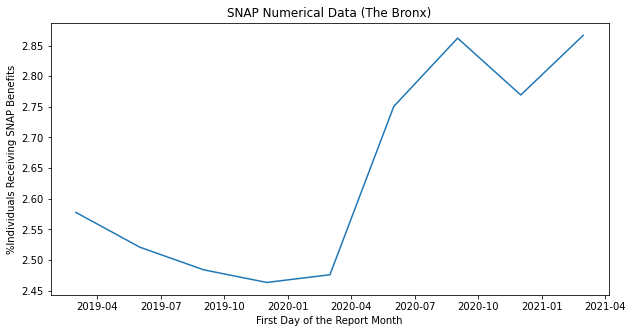

In [54]:
NYC_snap = snap_storm.query("Borough == 'BRONX'")
fig = plt.figure(figsize=(10,5))
seaborn = sns.lineplot(data=NYC_snap, x="First Day of the Report Month", y="%Individuals Receiving SNAP Benefits")
seaborn.set_title("SNAP Numerical Data (The Bronx)")

Text(0.5, 1.0, 'SNAP Numerical Data (Brooklyn)')

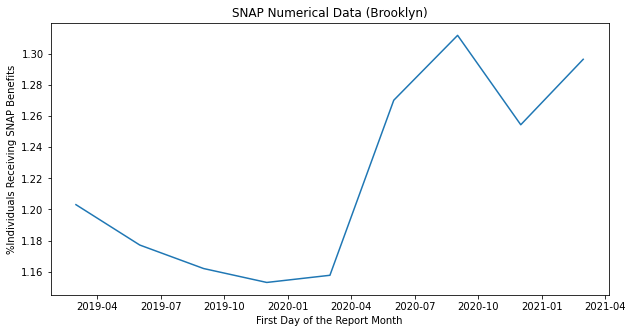

In [55]:
NYC_snap = snap_storm.query("Borough == 'BROOKLYN'")
fig = plt.figure(figsize=(10,5))
seaborn = sns.lineplot(data=NYC_snap, x="First Day of the Report Month", y="%Individuals Receiving SNAP Benefits")
seaborn.set_title("SNAP Numerical Data (Brooklyn)")

Text(0.5, 1.0, 'SNAP Numerical Data (Manhattan)')

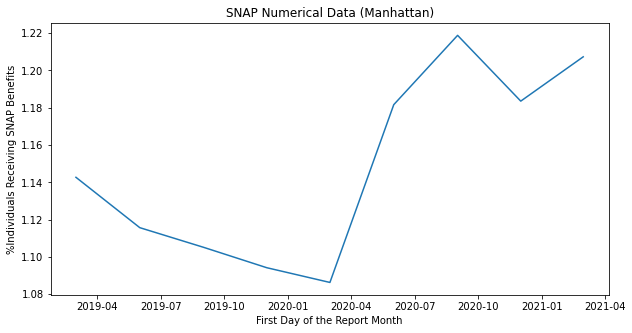

In [56]:
NYC_snap = snap_storm.query("Borough == 'MANHATTAN'")
fig = plt.figure(figsize=(10,5))
seaborn = sns.lineplot(data=NYC_snap, x="First Day of the Report Month", y="%Individuals Receiving SNAP Benefits")
seaborn.set_title("SNAP Numerical Data (Manhattan)")

Text(0.5, 1.0, 'SNAP Numerical Data (Queens)')

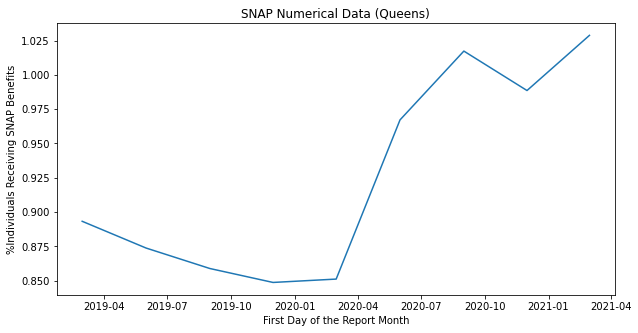

In [57]:
NYC_snap = snap_storm.query("Borough == 'QUEENS'")
fig = plt.figure(figsize=(10,5))
seaborn = sns.lineplot(data=NYC_snap, x="First Day of the Report Month", y="%Individuals Receiving SNAP Benefits")
seaborn.set_title("SNAP Numerical Data (Queens)")

Text(0.5, 1.0, 'SNAP Numerical Data (Staten Island)')

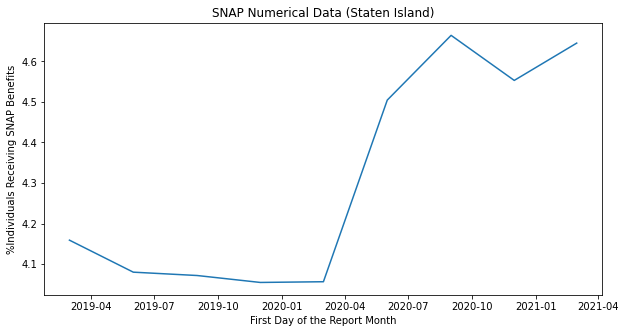

In [58]:
NYC_snap = snap_storm.query("Borough == 'STATEN ISLAND'")
fig = plt.figure(figsize=(10,5))
seaborn = sns.lineplot(data=NYC_snap, x="First Day of the Report Month", y="%Individuals Receiving SNAP Benefits")
seaborn.set_title("SNAP Numerical Data (Staten Island)")

In [59]:
snap_storm = snap_population.groupby(["Borough", "First Day of the Report Month"])[["%Total SNAP Persons"]].mean()
print(snap_storm)

                                             %Total SNAP Persons
Borough       First Day of the Report Month                     
BRONX         2019-03-01                                2.577733
              2019-06-01                                2.521001
              2019-09-01                                2.484070
              2019-12-01                                2.463434
              2020-03-01                                2.476003
              2020-06-01                                2.750624
              2020-09-01                                2.862136
              2020-12-01                                2.769357
              2021-03-01                                2.866692
BROOKLYN      2019-03-01                                1.203066
              2019-06-01                                1.177110
              2019-09-01                                1.162005
              2019-12-01                                1.153068
              2020-03-01 

Text(0.5, 1.0, 'SNAP Numerical Data (The Bronx)')

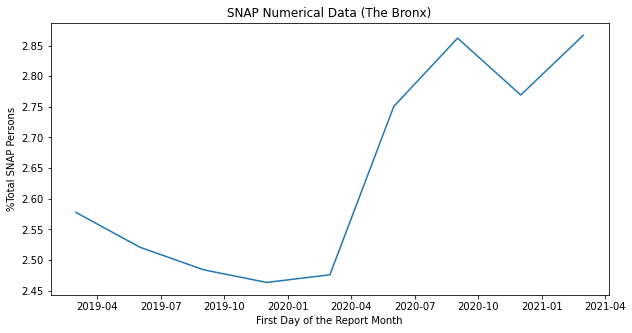

In [60]:
NYC_snappopulation = snap_storm.query("Borough == 'BRONX'")
fig = plt.figure(figsize=(10,5))
seaborn = sns.lineplot(data=NYC_snappopulation, x="First Day of the Report Month", y="%Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (The Bronx)")

Text(0.5, 1.0, 'SNAP Numerical Data (Brooklyn)')

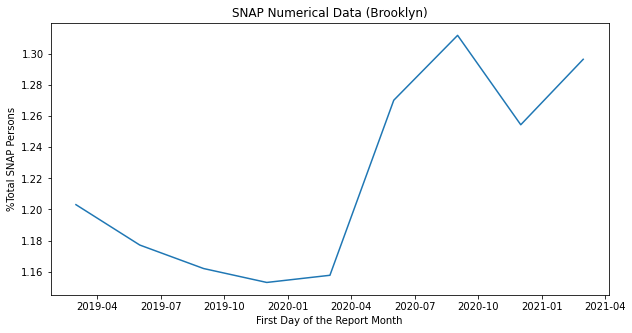

In [61]:
NYC_snappopulation = snap_storm.query("Borough == 'BROOKLYN'")
fig = plt.figure(figsize=(10,5))
seaborn = sns.lineplot(data=NYC_snappopulation, x="First Day of the Report Month", y="%Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Brooklyn)")

Text(0.5, 1.0, 'SNAP Numerical Data (Manhattan)')

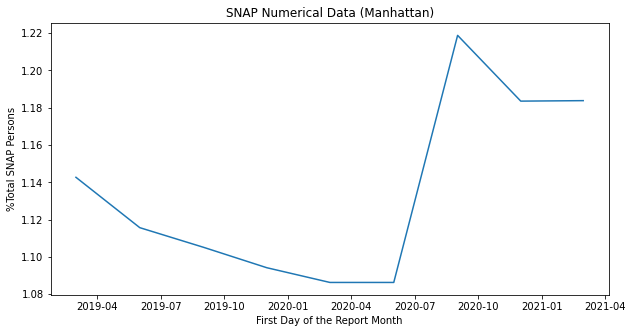

In [62]:
NYC_snappopulation = snap_storm.query("Borough == 'MANHATTAN'")
fig = plt.figure(figsize=(10,5))
seaborn = sns.lineplot(data=NYC_snappopulation, x="First Day of the Report Month", y="%Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Manhattan)")

Text(0.5, 1.0, 'SNAP Numerical Data (Queens)')

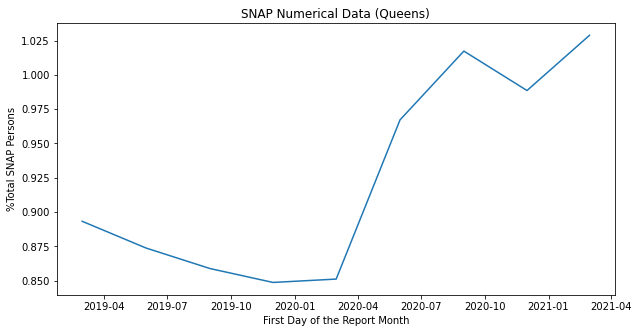

In [63]:
NYC_snappopulation = snap_storm.query("Borough == 'QUEENS'")
fig = plt.figure(figsize=(10,5))
seaborn = sns.lineplot(data=NYC_snappopulation, x="First Day of the Report Month", y="%Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Queens)")

Text(0.5, 1.0, 'SNAP Numerical Data (Staten Island)')

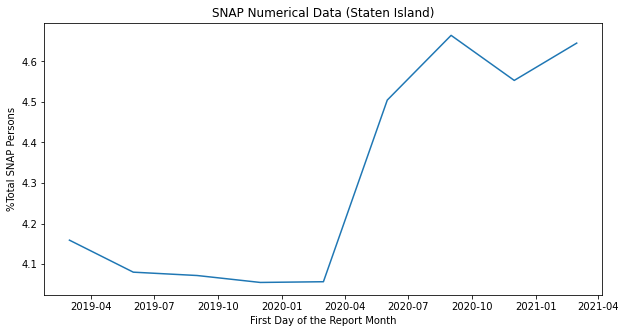

In [64]:
NYC_snappopulation = snap_storm.query("Borough == 'STATEN ISLAND'")
fig = plt.figure(figsize=(10,5))
seaborn = sns.lineplot(data=NYC_snappopulation, x="First Day of the Report Month", y="%Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Staten Island)")

In [65]:
snap_population.to_csv('Borough_Community_District_Report_-_SNAP_Population-6.csv', encoding='utf-8')

In [66]:
snap_population

,First Day of the Report Month,Borough,Community District,Individuals Receiving SNAP Benefits,Households Receiving SNAP Benefits,population,mean_population,%Total SNAP Persons,%Individuals Receiving SNAP Benefits
0,2020-09-01,MANHATTAN,M01,2276,1799,1628360,19846.000000,1.218772,0.139773
1,2020-09-01,MANHATTAN,M02,2994,2438,1628360,19846.000000,1.218772,0.183866
2,2020-09-01,MANHATTAN,M03,37879,26041,1628360,19846.000000,1.218772,2.326206
3,2020-09-01,MANHATTAN,M04,13035,9802,1628360,19846.000000,1.218772,0.800499
4,2020-09-01,MANHATTAN,M05,6159,4317,1628360,19846.000000,1.218772,0.378233
...,...,...,...,...,...,...,...,...,...
644,2021-03-01,QUEENS,Q13,22504,14033,2212360,22760.285714,1.028779,1.017194
645,2021-03-01,QUEENS,Q14,30355,16584,2212360,22760.285714,1.028779,1.372064
646,2021-03-01,STATEN ISLAND,S01,38964,20751,475909,22105.666667,4.644936,8.187280
647,2021-03-01,STATEN ISLAND,S02,15985,9256,475909,22105.666667,4.644936,3.358835


## Ploting Time and Date (Queens)  (NYC DATA)

In [ ]:
snap_population.agg(['min','max','mean','std'])

In [ ]:
snap_population_queens = pd.read_csv("Borough_Community_District_Report_-_SNAP_Population-2.csv")
snap_population_queens

In [ ]:
snap_population_queens.rename(columns = {'BC_SNAP_Recipients':'Individuals Receiving SNAP Benefits'}, inplace = True)
snap_population_queens

In [ ]:
snap_population_queens.rename(columns = {'BC_SNAP_Households':'Households Receiving SNAP Benefits'}, inplace = True)
snap_population_queens

In [ ]:
snap_population_queens.rename(columns = {'Month':'First Day of the Report Month'}, inplace = True)
snap_population_queens

In [ ]:
snap_population_queens.rename(columns = {'CD':'Community District'}, inplace = True)
snap_population_queens

In [ ]:
snap_population_queens.rename(columns = {'Boro':'Borough'}, inplace = True)
snap_population_queens

In [ ]:
snap_population_queens['First Day of the Report Month'] = snap_population_queens['First Day of the Report Month'].str.strip()
snap_population_queens.drop(snap_population_queens[snap_population_queens['First Day of the Report Month'] == '09/01/2018'].index, inplace = True)

In [ ]:
snap_population_queens['First Day of the Report Month'] = snap_population_queens['First Day of the Report Month'].str.strip()
snap_population_queens.drop(snap_population_queens[snap_population_queens['First Day of the Report Month'] == '12/01/2018'].index, inplace = True)

In [ ]:
snap_population_queens['First Day of the Report Month']= pd.to_datetime(snap_population_queens['First Day of the Report Month'])
snap_population_queens

In [ ]:
snap_population_queens['Individuals Receiving SNAP Benefits']=snap_population_queens['Individuals Receiving SNAP Benefits'].str.replace(',','').astype(int)
snap_population_queens

In [ ]:
snap_population_queens['Households Receiving SNAP Benefits']=snap_population_queens['Households Receiving SNAP Benefits'].str.replace(',','').astype(int)
snap_population_queens

In [ ]:
snap_population_queens.describe() 

In [ ]:
#datetime(2019,12, 1)
#datetime(2019,3, 1)
#datetime(2019, 6, 1)
#datetime(2019, 9, 1)
#datetime(2020, 12, 1)
#datetime(2020, 3, 1)
#datetime(2020, 9, 1)
#datetime(2020, 6, 1)
#datetime(2021, 3, 1)

In [ ]:
snap_population_queens.tail()

In [ ]:
snap_population_queens.plot
plt.show()

# SNAP Numerical Data (State)

In [69]:
snap_population_state = pd.read_csv("Supplemental_Nutrition_Assistance_Program__SNAP__Caseloads_and_Expenditures__Beginning_2002-4.csv")
snap_population_state


,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Year,Month,Month Code,District Code,District,Total SNAP Households,Total SNAP Persons,Total SNAP Benefits,Temporary Assistance SNAP Households,Temporary Assistance SNAP Persons,Temporary Assistance SNAP Benefits,Non-Temporary Assistance SNAP Households,Non-Temporary Assistance SNAP Persons,Non-Temporary Assistance SNAP Benefits
0,0,0,0,0,2020,June,6,1,Albany,19242,35151,5874893,5815,7657,1364683,13427,27494,4510210
1,1,1,1,1,2020,May,5,1,Albany,19063,34859,6131723,5851,7811,1430643,13212,27048,4701080
2,2,2,2,2,2020,April,4,1,Albany,18611,33675,7436275,5878,7825,1671893,12733,25850,5764382
3,3,3,3,3,2020,March,3,1,Albany,17514,31697,4000134,5808,7807,1179476,11706,23890,2820658
4,4,4,4,4,2020,February,2,1,Albany,17308,31290,3947807,5840,7904,1194948,11468,23386,2752859
5,5,5,5,5,2020,January,1,1,Albany,17464,31630,4000453,5951,8066,1224636,11513,23564,2775817
6,6,6,6,6,2019,December,12,1,Albany,17405,31658,4031722,5873,8022,1227758,11532,23636,2803964
7,7,7,7,7,2019,November,11,1,Albany,17431,31770,4042487,5906,8111,1236691,11525,23659,2805796
8,8,8,8,8,2019,October,10,1,Albany,17514,31762,4059097,5920,8132,1243373,11594,23630,2815724
9,9,9,9,9,2019,September,9,1,Albany,17474,31806,4007529,5922,8142,1229277,11552,23664,2778252


In [5]:
snap_population_state.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'Unnamed: 0.1.1', 'Unnamed: 0.1.1.1',
       'Year', 'Month', 'Month Code', 'District Code', 'District',
       'Total SNAP Households', 'Total SNAP Persons', 'Total SNAP Benefits',
       'Temporary Assistance SNAP Households',
       'Temporary Assistance SNAP Persons',
       'Temporary Assistance SNAP Benefits',
       'Non-Temporary Assistance SNAP Households',
       'Non-Temporary Assistance SNAP Persons',
       'Non-Temporary Assistance SNAP Benefits'],
      dtype='object')

In [70]:
snap_population_state.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1566 entries, 0 to 1565
Data columns (total 18 columns):
 #   Column                                    Non-Null Count  Dtype 
---  ------                                    --------------  ----- 
 0   Unnamed: 0                                1566 non-null   int64 
 1   Unnamed: 0.1                              1566 non-null   int64 
 2   Unnamed: 0.1.1                            1566 non-null   int64 
 3   Unnamed: 0.1.1.1                          1566 non-null   int64 
 4   Year                                      1566 non-null   int64 
 5   Month                                     1566 non-null   object
 6   Month Code                                1566 non-null   int64 
 7   District Code                             1566 non-null   int64 
 8   District                                  1566 non-null   object
 9   Total SNAP Households                     1566 non-null   int64 
 10  Total SNAP Persons                        1566 n

In [71]:
snap_population_state['Year'] = snap_population_state['Year'].apply(str)

In [72]:
snap_population_state.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1566 entries, 0 to 1565
Data columns (total 18 columns):
 #   Column                                    Non-Null Count  Dtype 
---  ------                                    --------------  ----- 
 0   Unnamed: 0                                1566 non-null   int64 
 1   Unnamed: 0.1                              1566 non-null   int64 
 2   Unnamed: 0.1.1                            1566 non-null   int64 
 3   Unnamed: 0.1.1.1                          1566 non-null   int64 
 4   Year                                      1566 non-null   object
 5   Month                                     1566 non-null   object
 6   Month Code                                1566 non-null   int64 
 7   District Code                             1566 non-null   int64 
 8   District                                  1566 non-null   object
 9   Total SNAP Households                     1566 non-null   int64 
 10  Total SNAP Persons                        1566 n

In [73]:
snap_population_state['Year'] = snap_population_state['Year'].str.strip()
snap_population_state.drop(snap_population_state[snap_population_state['Year'] == '2002'].index, inplace = True)

In [74]:
snap_population_state['Year'] = snap_population_state['Year'].str.strip()
snap_population_state.drop(snap_population_state[snap_population_state['Year'] == '2003'].index, inplace = True)

In [75]:
snap_population_state['Year'] = snap_population_state['Year'].str.strip()
snap_population_state.drop(snap_population_state[snap_population_state['Year'] == '2004'].index, inplace = True)

In [76]:
snap_population_state['Year'] = snap_population_state['Year'].str.strip()
snap_population_state.drop(snap_population_state[snap_population_state['Year'] == '2005'].index, inplace = True)

In [77]:
snap_population_state['Year'] = snap_population_state['Year'].str.strip()
snap_population_state.drop(snap_population_state[snap_population_state['Year'] == '2006'].index, inplace = True)

In [78]:
snap_population_state['Year'] = snap_population_state['Year'].str.strip()
snap_population_state.drop(snap_population_state[snap_population_state['Year'] == '2007'].index, inplace = True)

In [79]:
snap_population_state['Year'] = snap_population_state['Year'].str.strip()
snap_population_state.drop(snap_population_state[snap_population_state['Year'] == '2008'].index, inplace = True)

In [80]:
snap_population_state['Year'] = snap_population_state['Year'].str.strip()
snap_population_state.drop(snap_population_state[snap_population_state['Year'] == '2009'].index, inplace = True)

In [81]:
snap_population_state['Year'] = snap_population_state['Year'].str.strip()
snap_population_state.drop(snap_population_state[snap_population_state['Year'] == '2010'].index, inplace = True)

In [82]:
snap_population_state['Year'] = snap_population_state['Year'].str.strip()
snap_population_state.drop(snap_population_state[snap_population_state['Year'] == '2011'].index, inplace = True)

In [83]:
snap_population_state['Year'] = snap_population_state['Year'].str.strip()
snap_population_state.drop(snap_population_state[snap_population_state['Year'] == '2012'].index, inplace = True)

In [84]:
snap_population_state['Year'] = snap_population_state['Year'].str.strip()
snap_population_state.drop(snap_population_state[snap_population_state['Year'] == '2013'].index, inplace = True)

In [85]:
snap_population_state['Year'] = snap_population_state['Year'].str.strip()
snap_population_state.drop(snap_population_state[snap_population_state['Year'] == '2014'].index, inplace = True)

In [86]:
snap_population_state['Year'] = snap_population_state['Year'].str.strip()
snap_population_state.drop(snap_population_state[snap_population_state['Year'] == '2015'].index, inplace = True)

In [87]:
snap_population_state['Year'] = snap_population_state['Year'].str.strip()
snap_population_state.drop(snap_population_state[snap_population_state['Year'] == '2016'].index, inplace = True)

In [88]:
snap_population_state['Year'] = snap_population_state['Year'].str.strip()
snap_population_state.drop(snap_population_state[snap_population_state['Year'] == '2017'].index, inplace = True)

In [89]:
snap_population_state['Year'] = snap_population_state['Year'].str.strip()
snap_population_state.drop(snap_population_state[snap_population_state['Year'] == '2018'].index, inplace = True)

In [90]:
snap_population_state

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Year,Month,Month Code,District Code,District,Total SNAP Households,Total SNAP Persons,Total SNAP Benefits,Temporary Assistance SNAP Households,Temporary Assistance SNAP Persons,Temporary Assistance SNAP Benefits,Non-Temporary Assistance SNAP Households,Non-Temporary Assistance SNAP Persons,Non-Temporary Assistance SNAP Benefits
0,0,0,0,0,2020,June,6,1,Albany,19242,35151,5874893,5815,7657,1364683,13427,27494,4510210
1,1,1,1,1,2020,May,5,1,Albany,19063,34859,6131723,5851,7811,1430643,13212,27048,4701080
2,2,2,2,2,2020,April,4,1,Albany,18611,33675,7436275,5878,7825,1671893,12733,25850,5764382
3,3,3,3,3,2020,March,3,1,Albany,17514,31697,4000134,5808,7807,1179476,11706,23890,2820658
4,4,4,4,4,2020,February,2,1,Albany,17308,31290,3947807,5840,7904,1194948,11468,23386,2752859
5,5,5,5,5,2020,January,1,1,Albany,17464,31630,4000453,5951,8066,1224636,11513,23564,2775817
6,6,6,6,6,2019,December,12,1,Albany,17405,31658,4031722,5873,8022,1227758,11532,23636,2803964
7,7,7,7,7,2019,November,11,1,Albany,17431,31770,4042487,5906,8111,1236691,11525,23659,2805796
8,8,8,8,8,2019,October,10,1,Albany,17514,31762,4059097,5920,8132,1243373,11594,23630,2815724
9,9,9,9,9,2019,September,9,1,Albany,17474,31806,4007529,5922,8142,1229277,11552,23664,2778252


In [93]:
snap_population_state.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1566 entries, 0 to 1565
Data columns (total 18 columns):
 #   Column                                    Non-Null Count  Dtype 
---  ------                                    --------------  ----- 
 0   Unnamed: 0                                1566 non-null   int64 
 1   Unnamed: 0.1                              1566 non-null   int64 
 2   Unnamed: 0.1.1                            1566 non-null   int64 
 3   Unnamed: 0.1.1.1                          1566 non-null   int64 
 4   Year                                      1566 non-null   object
 5   Month                                     1566 non-null   object
 6   Month Code                                1566 non-null   int64 
 7   District Code                             1566 non-null   int64 
 8   District                                  1566 non-null   object
 9   Total SNAP Households                     1566 non-null   int64 
 10  Total SNAP Persons                        1566 n

In [94]:
snap_population_state['Year'] = snap_population_state['Year'].apply(int)

In [95]:
snap_population_state.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1566 entries, 0 to 1565
Data columns (total 18 columns):
 #   Column                                    Non-Null Count  Dtype 
---  ------                                    --------------  ----- 
 0   Unnamed: 0                                1566 non-null   int64 
 1   Unnamed: 0.1                              1566 non-null   int64 
 2   Unnamed: 0.1.1                            1566 non-null   int64 
 3   Unnamed: 0.1.1.1                          1566 non-null   int64 
 4   Year                                      1566 non-null   int64 
 5   Month                                     1566 non-null   object
 6   Month Code                                1566 non-null   int64 
 7   District Code                             1566 non-null   int64 
 8   District                                  1566 non-null   object
 9   Total SNAP Households                     1566 non-null   int64 
 10  Total SNAP Persons                        1566 n

In [96]:
snap_population_state.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'Unnamed: 0.1.1', 'Unnamed: 0.1.1.1',
       'Year', 'Month', 'Month Code', 'District Code', 'District',
       'Total SNAP Households', 'Total SNAP Persons', 'Total SNAP Benefits',
       'Temporary Assistance SNAP Households',
       'Temporary Assistance SNAP Persons',
       'Temporary Assistance SNAP Benefits',
       'Non-Temporary Assistance SNAP Households',
       'Non-Temporary Assistance SNAP Persons',
       'Non-Temporary Assistance SNAP Benefits'],
      dtype='object')

In [97]:
snap_population_state['Non-Temporary Assistance SNAP Households']=snap_population_state['Non-Temporary Assistance SNAP Households'].str.replace(',','').astype(int)

AttributeError: Can only use .str accessor with string values!

In [98]:
snap_population_state['Non-Temporary Assistance SNAP Persons']=snap_population_state['Non-Temporary Assistance SNAP Persons'].str.replace(',','').astype(int)

AttributeError: Can only use .str accessor with string values!

In [99]:
snap_population_state['Non-Temporary Assistance SNAP Benefits']=snap_population_state['Non-Temporary Assistance SNAP Benefits'].str.replace(',','').astype(int)

AttributeError: Can only use .str accessor with string values!

In [100]:
snap_population_state.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1566 entries, 0 to 1565
Data columns (total 18 columns):
 #   Column                                    Non-Null Count  Dtype 
---  ------                                    --------------  ----- 
 0   Unnamed: 0                                1566 non-null   int64 
 1   Unnamed: 0.1                              1566 non-null   int64 
 2   Unnamed: 0.1.1                            1566 non-null   int64 
 3   Unnamed: 0.1.1.1                          1566 non-null   int64 
 4   Year                                      1566 non-null   int64 
 5   Month                                     1566 non-null   object
 6   Month Code                                1566 non-null   int64 
 7   District Code                             1566 non-null   int64 
 8   District                                  1566 non-null   object
 9   Total SNAP Households                     1566 non-null   int64 
 10  Total SNAP Persons                        1566 n

In [101]:
snap_population_state.describe()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Year,Month Code,District Code,Total SNAP Households,Total SNAP Persons,Total SNAP Benefits,Temporary Assistance SNAP Households,Temporary Assistance SNAP Persons,Temporary Assistance SNAP Benefits,Non-Temporary Assistance SNAP Households,Non-Temporary Assistance SNAP Persons,Non-Temporary Assistance SNAP Benefits
count,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1.566000e+03,1.566000e+03,1566.000000,1566.000000,1.566000e+03,1566.000000,1.566000e+03,1.566000e+03
mean,782.500000,782.500000,7948.109195,7948.109195,2019.666667,6.000000,29.637931,26468.854406,4.614267e+04,7.561063e+06,10809.351213,15580.754151,2.725525e+06,15659.503193,3.056192e+04,4.835539e+06
std,452.209575,452.209575,4813.160571,4813.160571,0.666880,3.560163,17.011210,119918.563392,2.049672e+05,3.538442e+07,55098.862832,82098.231842,1.464357e+07,64926.632808,1.230698e+05,2.081020e+07
min,0.000000,0.000000,0.000000,0.000000,2019.000000,1.000000,1.000000,172.000000,2.460000e+02,3.080900e+04,47.000000,48.000000,8.545000e+03,124.000000,1.930000e+02,2.139300e+04
25%,391.250000,391.250000,3471.250000,3471.250000,2019.000000,3.000000,15.000000,2912.250000,5.183250e+03,6.913590e+05,951.000000,1138.500000,1.952002e+05,1970.250000,3.942250e+03,5.068642e+05
50%,782.500000,782.500000,8694.500000,8694.500000,2020.000000,6.000000,29.500000,4907.500000,8.457000e+03,1.261040e+06,1571.000000,1958.000000,3.449565e+05,3420.500000,6.673500e+03,9.681955e+05
75%,1173.750000,1173.750000,13005.750000,13005.750000,2020.000000,9.000000,44.000000,11138.250000,2.058350e+04,3.332235e+06,3650.500000,4530.750000,8.314138e+05,7254.500000,1.441675e+04,2.371194e+06
max,1565.000000,1565.000000,13397.000000,13397.000000,2021.000000,12.000000,66.000000,998272.000000,1.705337e+06,3.828340e+08,449170.000000,671885.000000,1.517011e+08,557214.000000,1.038678e+06,2.311329e+08


<AxesSubplot:>

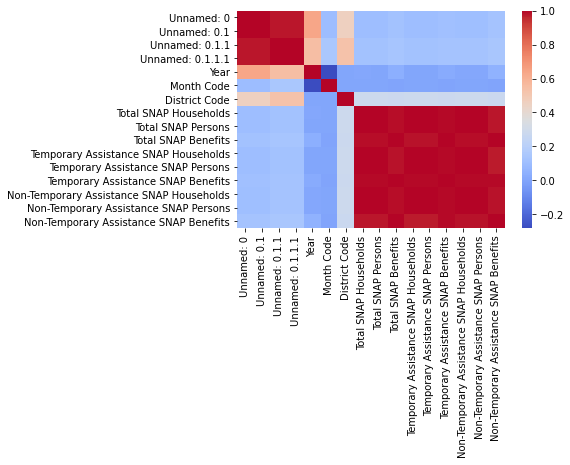

In [102]:
plt.figure(figsize=(6,4))
sns.heatmap(snap_population_state.corr(),cmap='coolwarm',annot=False) 

In [103]:
snap_population_state.nunique()

Unnamed: 0                                  1566
Unnamed: 0.1                                1566
Unnamed: 0.1.1                              1566
Unnamed: 0.1.1.1                            1566
Year                                           3
Month                                         12
Month Code                                    12
District Code                                 58
District                                      58
Total SNAP Households                       1438
Total SNAP Persons                          1492
Total SNAP Benefits                         1565
Temporary Assistance SNAP Households        1253
Temporary Assistance SNAP Persons           1319
Temporary Assistance SNAP Benefits          1562
Non-Temporary Assistance SNAP Households    1412
Non-Temporary Assistance SNAP Persons       1467
Non-Temporary Assistance SNAP Benefits      1566
dtype: int64

In [104]:
table=snap_population_state.corr()
table=table[['Year','Total SNAP Households',
       'Total SNAP Persons', 'Total SNAP Benefits',
       'Temporary Assistance SNAP Households',
       'Temporary Assistance SNAP Persons',
       'Temporary Assistance SNAP Benefits',
       'Non-Temporary Assistance SNAP Households',
       'Non-Temporary Assistance SNAP Persons',
       'Non-Temporary Assistance SNAP Benefits']]
table.style.background_gradient(cmap="RdBu").set_precision(2)

,Year,Total SNAP Households,Total SNAP Persons,Total SNAP Benefits,Temporary Assistance SNAP Households,Temporary Assistance SNAP Persons,Temporary Assistance SNAP Benefits,Non-Temporary Assistance SNAP Households,Non-Temporary Assistance SNAP Persons,Non-Temporary Assistance SNAP Benefits
Unnamed: 0,0.64,0.10,0.10,0.12,0.10,0.10,0.11,0.11,0.11,0.13
Unnamed: 0.1,0.64,0.10,0.10,0.12,0.10,0.10,0.11,0.11,0.11,0.13
Unnamed: 0.1.1,0.54,0.12,0.12,0.13,0.12,0.12,0.13,0.12,0.12,0.14
Unnamed: 0.1.1.1,0.54,0.12,0.12,0.13,0.12,0.12,0.13,0.12,0.12,0.14
Year,1.00,0.00,0.00,0.04,0.00,-0.00,0.02,0.01,0.01,0.05
Month Code,-0.28,0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00
District Code,-0.00,0.28,0.28,0.28,0.28,0.28,0.28,0.28,0.28,0.27
Total SNAP Households,0.00,1.00,1.00,0.99,1.00,1.00,0.99,1.00,1.00,0.98
Total SNAP Persons,0.00,1.00,1.00,0.99,1.00,1.00,0.99,1.00,1.00,0.98
Total SNAP Benefits,0.04,0.99,0.99,1.00,0.98,0.98,1.00,0.99,0.99,1.00


<AxesSubplot:>

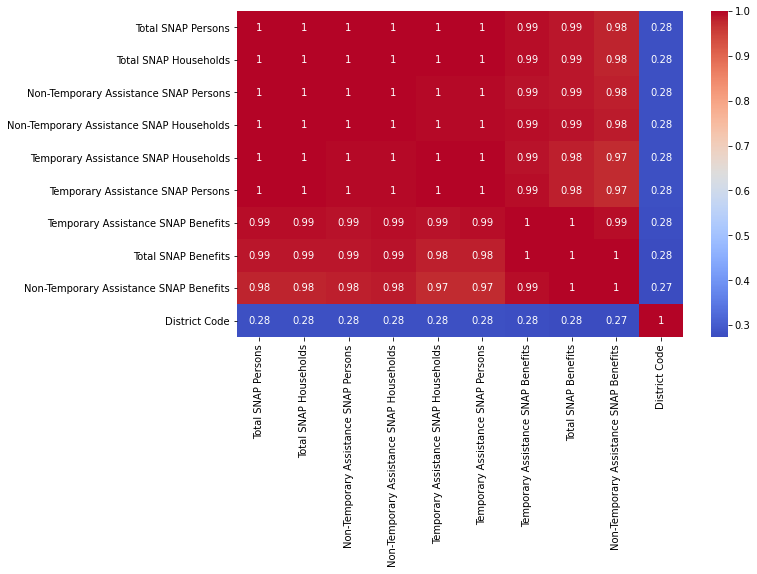

In [105]:
#Quality correlation matrix
k = 10 #number of variables for heatmap
cols = snap_population_state.corr().nlargest(k, 'Total SNAP Persons')['Total SNAP Persons'].index
cm = snap_population_state[cols].corr()
plt.figure(figsize=(10,6))
sns.heatmap(cm, annot=True, cmap = 'coolwarm')

In [106]:
snap_population_state.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1566 entries, 0 to 1565
Data columns (total 18 columns):
 #   Column                                    Non-Null Count  Dtype 
---  ------                                    --------------  ----- 
 0   Unnamed: 0                                1566 non-null   int64 
 1   Unnamed: 0.1                              1566 non-null   int64 
 2   Unnamed: 0.1.1                            1566 non-null   int64 
 3   Unnamed: 0.1.1.1                          1566 non-null   int64 
 4   Year                                      1566 non-null   int64 
 5   Month                                     1566 non-null   object
 6   Month Code                                1566 non-null   int64 
 7   District Code                             1566 non-null   int64 
 8   District                                  1566 non-null   object
 9   Total SNAP Households                     1566 non-null   int64 
 10  Total SNAP Persons                        1566 n

In [107]:
snap_population_state.corr()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Year,Month Code,District Code,Total SNAP Households,Total SNAP Persons,Total SNAP Benefits,Temporary Assistance SNAP Households,Temporary Assistance SNAP Persons,Temporary Assistance SNAP Benefits,Non-Temporary Assistance SNAP Households,Non-Temporary Assistance SNAP Persons,Non-Temporary Assistance SNAP Benefits
Unnamed: 0,1.000000,1.000000,0.976943,0.976943,6.370763e-01,9.692542e-02,4.559088e-01,0.103660,0.103153,0.120546,0.101092,0.099948,0.110059,0.105668,0.105124,0.127524
Unnamed: 0.1,1.000000,1.000000,0.976943,0.976943,6.370763e-01,9.692542e-02,4.559088e-01,0.103660,0.103153,0.120546,0.101092,0.099948,0.110059,0.105668,0.105124,0.127524
Unnamed: 0.1.1,0.976943,0.976943,1.000000,1.000000,5.447632e-01,1.453538e-01,5.270070e-01,0.123942,0.123433,0.134393,0.122520,0.121261,0.126596,0.124944,0.124681,0.139432
Unnamed: 0.1.1.1,0.976943,0.976943,1.000000,1.000000,5.447632e-01,1.453538e-01,5.270070e-01,0.123942,0.123433,0.134393,0.122520,0.121261,0.126596,0.124944,0.124681,0.139432
Year,0.637076,0.637076,0.544763,0.544763,1.000000e+00,-2.809757e-01,-1.624174e-12,0.004850,0.004078,0.038384,0.000279,-0.000524,0.021472,0.008720,0.007141,0.050156
Month Code,0.096925,0.096925,0.145354,0.145354,-2.809757e-01,1.000000e+00,-7.544690e-16,0.000140,-0.000354,-0.001886,0.000057,-0.000282,-0.002734,0.000210,-0.000402,-0.001283
District Code,0.455909,0.455909,0.527007,0.527007,-1.624174e-12,-7.544690e-16,1.000000e+00,0.280517,0.280320,0.275494,0.280651,0.279941,0.277206,0.279942,0.280116,0.273371
Total SNAP Households,0.103660,0.103660,0.123942,0.123942,4.849539e-03,1.400265e-04,2.805172e-01,1.000000,0.999858,0.986724,0.998950,0.998787,0.993079,0.999244,0.998941,0.978964
Total SNAP Persons,0.103153,0.103153,0.123433,0.123433,4.077520e-03,-3.543543e-04,2.803203e-01,0.999858,1.000000,0.986282,0.998659,0.998532,0.992446,0.999229,0.999347,0.978658
Total SNAP Benefits,0.120546,0.120546,0.134393,0.134393,3.838354e-02,-1.885838e-03,2.754939e-01,0.986724,0.986282,1.000000,0.981807,0.982030,0.997219,0.989272,0.987509,0.998624


In [108]:
snap_population_state.diff

<bound method DataFrame.diff of       Unnamed: 0  Unnamed: 0.1  Unnamed: 0.1.1  Unnamed: 0.1.1.1  Year  \
0              0             0               0                 0  2020   
1              1             1               1                 1  2020   
2              2             2               2                 2  2020   
3              3             3               3                 3  2020   
4              4             4               4                 4  2020   
5              5             5               5                 5  2020   
6              6             6               6                 6  2019   
7              7             7               7                 7  2019   
8              8             8               8                 8  2019   
9              9             9               9                 9  2019   
10            10            10              10                10  2019   
11            11            11              11                11  2019   
12    

In [109]:
snap_population_state['Year'] = snap_population_state['Year'].apply(str)

In [110]:
snap_population_state.drop(['Month Code'], axis = 1, errors='ignore')

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Year,Month,District Code,District,Total SNAP Households,Total SNAP Persons,Total SNAP Benefits,Temporary Assistance SNAP Households,Temporary Assistance SNAP Persons,Temporary Assistance SNAP Benefits,Non-Temporary Assistance SNAP Households,Non-Temporary Assistance SNAP Persons,Non-Temporary Assistance SNAP Benefits
0,0,0,0,0,2020,June,1,Albany,19242,35151,5874893,5815,7657,1364683,13427,27494,4510210
1,1,1,1,1,2020,May,1,Albany,19063,34859,6131723,5851,7811,1430643,13212,27048,4701080
2,2,2,2,2,2020,April,1,Albany,18611,33675,7436275,5878,7825,1671893,12733,25850,5764382
3,3,3,3,3,2020,March,1,Albany,17514,31697,4000134,5808,7807,1179476,11706,23890,2820658
4,4,4,4,4,2020,February,1,Albany,17308,31290,3947807,5840,7904,1194948,11468,23386,2752859
5,5,5,5,5,2020,January,1,Albany,17464,31630,4000453,5951,8066,1224636,11513,23564,2775817
6,6,6,6,6,2019,December,1,Albany,17405,31658,4031722,5873,8022,1227758,11532,23636,2803964
7,7,7,7,7,2019,November,1,Albany,17431,31770,4042487,5906,8111,1236691,11525,23659,2805796
8,8,8,8,8,2019,October,1,Albany,17514,31762,4059097,5920,8132,1243373,11594,23630,2815724
9,9,9,9,9,2019,September,1,Albany,17474,31806,4007529,5922,8142,1229277,11552,23664,2778252


In [111]:
snap_population_state.drop(['District Code'], axis = 1, errors='ignore')

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Year,Month,Month Code,District,Total SNAP Households,Total SNAP Persons,Total SNAP Benefits,Temporary Assistance SNAP Households,Temporary Assistance SNAP Persons,Temporary Assistance SNAP Benefits,Non-Temporary Assistance SNAP Households,Non-Temporary Assistance SNAP Persons,Non-Temporary Assistance SNAP Benefits
0,0,0,0,0,2020,June,6,Albany,19242,35151,5874893,5815,7657,1364683,13427,27494,4510210
1,1,1,1,1,2020,May,5,Albany,19063,34859,6131723,5851,7811,1430643,13212,27048,4701080
2,2,2,2,2,2020,April,4,Albany,18611,33675,7436275,5878,7825,1671893,12733,25850,5764382
3,3,3,3,3,2020,March,3,Albany,17514,31697,4000134,5808,7807,1179476,11706,23890,2820658
4,4,4,4,4,2020,February,2,Albany,17308,31290,3947807,5840,7904,1194948,11468,23386,2752859
5,5,5,5,5,2020,January,1,Albany,17464,31630,4000453,5951,8066,1224636,11513,23564,2775817
6,6,6,6,6,2019,December,12,Albany,17405,31658,4031722,5873,8022,1227758,11532,23636,2803964
7,7,7,7,7,2019,November,11,Albany,17431,31770,4042487,5906,8111,1236691,11525,23659,2805796
8,8,8,8,8,2019,October,10,Albany,17514,31762,4059097,5920,8132,1243373,11594,23630,2815724
9,9,9,9,9,2019,September,9,Albany,17474,31806,4007529,5922,8142,1229277,11552,23664,2778252


In [112]:
snap_population_state.mean(axis=1)

0       7.905719e+05
1       8.247533e+05
2       9.984757e+05
3       5.399137e+05
4       5.328553e+05
5       5.399411e+05
6       5.441071e+05
7       5.455611e+05
8       5.477859e+05
9       5.409109e+05
10      5.432977e+05
11      5.433960e+05
12      5.380285e+05
13      5.379140e+05
14      5.384402e+05
15      5.401607e+05
16      5.394426e+05
17      5.496005e+05
18      1.061965e+05
19      1.209317e+05
20      1.632259e+05
21      7.662513e+04
22      7.736587e+04
23      7.648700e+04
24      7.783427e+04
25      7.696553e+04
26      7.900173e+04
27      7.801580e+04
28      7.779720e+04
29      7.909473e+04
30      7.957093e+04
31      8.156967e+04
32      8.171733e+04
33      8.348127e+04
34      8.313893e+04
35      8.377020e+04
36      6.347901e+05
37      6.541771e+05
38      8.203393e+05
39      4.579432e+05
40      4.612597e+05
41      4.662003e+05
42      4.684631e+05
43      4.694165e+05
44      4.738122e+05
45      4.645168e+05
46      4.641193e+05
47      4.680

In [113]:
snap_population_state.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1566 entries, 0 to 1565
Data columns (total 18 columns):
 #   Column                                    Non-Null Count  Dtype 
---  ------                                    --------------  ----- 
 0   Unnamed: 0                                1566 non-null   int64 
 1   Unnamed: 0.1                              1566 non-null   int64 
 2   Unnamed: 0.1.1                            1566 non-null   int64 
 3   Unnamed: 0.1.1.1                          1566 non-null   int64 
 4   Year                                      1566 non-null   object
 5   Month                                     1566 non-null   object
 6   Month Code                                1566 non-null   int64 
 7   District Code                             1566 non-null   int64 
 8   District                                  1566 non-null   object
 9   Total SNAP Households                     1566 non-null   int64 
 10  Total SNAP Persons                        1566 n

In [114]:
storm = snap_population_state.groupby(["District", "Year"])[["Total SNAP Persons"]].mean()
pd.set_option("display.max_rows", None, "display.max_columns", None)
print(storm)


                    Total SNAP Persons
District      Year                    
Albany        2019        3.183675e+04
              2020        3.386167e+04
              2021        3.410400e+04
Allegany      2019        5.204750e+03
              2020        4.839167e+03
              2021        5.047000e+03
Broome        2019        2.744050e+04
              2020        2.609492e+04
              2021        2.539267e+04
Cattaraugus   2019        1.057350e+04
              2020        1.039258e+04
              2021        1.059467e+04
Cayuga        2019        9.210000e+03
              2020        8.921583e+03
              2021        9.171333e+03
Chautauqua    2019        2.317442e+04
              2020        2.334767e+04
              2021        2.341133e+04
Chemung       2019        1.289225e+04
              2020        1.335225e+04
              2021        1.324633e+04
Chenango      2019        5.978917e+03
              2020        5.698417e+03
              2021       

Text(0.5, 1.0, 'SNAP Numerical Data (Rockland)')

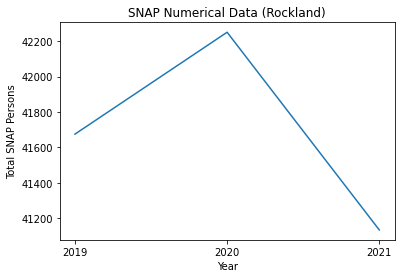

In [118]:
Rockland_snap = storm.query("District == 'Rockland'")
seaborn = sns.lineplot(data=Rockland_snap, x="Year", y="Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Rockland)")

Text(0.5, 1.0, 'SNAP Numerical Data (New York City)')

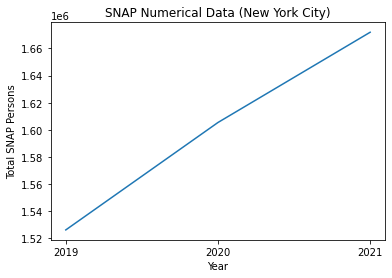

In [119]:
NYC_snap = storm.query("District == 'New York City'")
seaborn = sns.lineplot(data=NYC_snap, x="Year", y="Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (New York City)")

Text(0.5, 1.0, 'SNAP Numerical Data (Albany)')

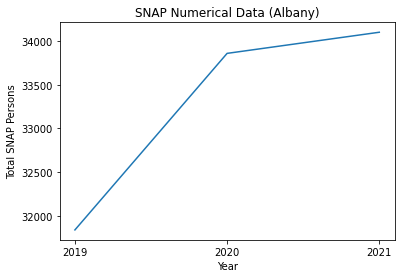

In [117]:
Albany_snap = storm.query("District == 'Albany'")
seaborn = sns.lineplot(data=Albany_snap, x="Year", y="Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Albany)")

Text(0.5, 1.0, 'SNAP Numerical Data (Montgomery)')

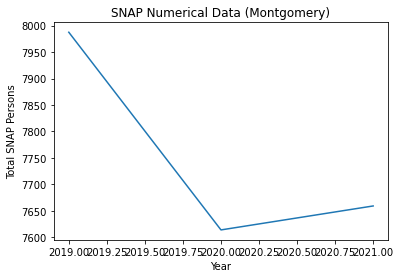

In [38]:
Montgomery_snap = storm.query("District == 'Montgomery'")
seaborn = sns.lineplot(data=Montgomery_snap, x="Year", y="Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Montgomery)")

Text(0.5, 1.0, 'SNAP Numerical Data (Erie)')

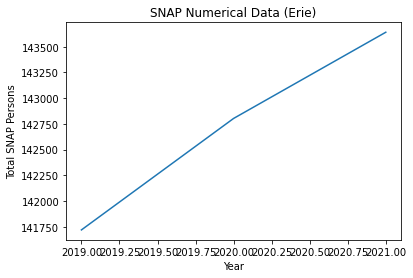

In [39]:
Erie_snap = storm.query("District == 'Erie'")
seaborn = sns.lineplot(data=Erie_snap, x="Year", y="Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Erie)")

Text(0.5, 1.0, 'SNAP Numerical Data (Monroe)')

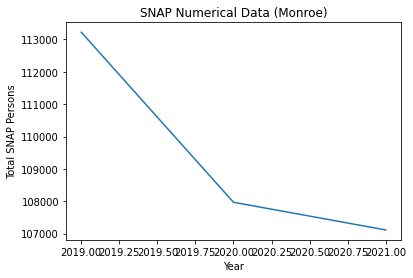

In [40]:
Monroe_snap = storm.query("District == 'Monroe'")
seaborn = sns.lineplot(data=Monroe_snap, x="Year", y="Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Monroe)")

Text(0.5, 1.0, 'SNAP Numerical Data (Nassau)')

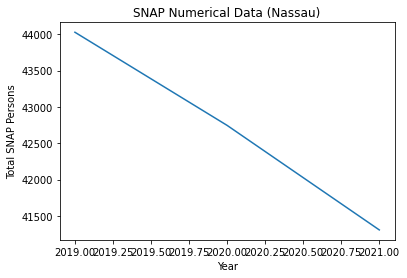

In [41]:
Nassau_snap = storm.query("District == 'Nassau'")
seaborn = sns.lineplot(data=Nassau_snap, x="Year", y="Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Nassau)")

Text(0.5, 1.0, 'SNAP Numerical Data (New York City)')

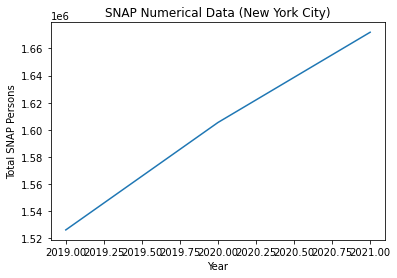

In [42]:
NYC_snap = storm.query("District == 'New York City'")
seaborn = sns.lineplot(data=NYC_snap, x="Year", y="Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (New York City)")

Text(0.5, 1.0, 'SNAP Numerical Data (Oneida)')

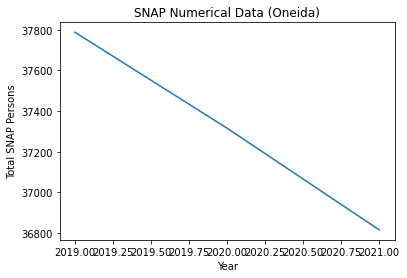

In [43]:
Oneida_snap = storm.query("District == 'Oneida'")
seaborn = sns.lineplot(data=Oneida_snap, x="Year", y="Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Oneida)")

Text(0.5, 1.0, 'SNAP Numerical Data (Onodaga)')

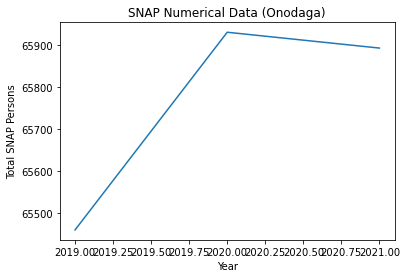

In [44]:
Onondaga_snap = storm.query("District == 'Onondaga'")
seaborn = sns.lineplot(data=Onondaga_snap, x="Year", y="Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Onodaga)")

Text(0.5, 1.0, 'SNAP Numerical Data (Orange)')

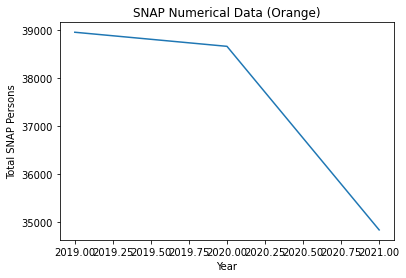

In [45]:
Orange_snap = storm.query("District == 'Orange'")
seaborn = sns.lineplot(data=Orange_snap, x="Year", y="Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Orange)")

Text(0.5, 1.0, 'SNAP Numerical Data (Suffolk)')

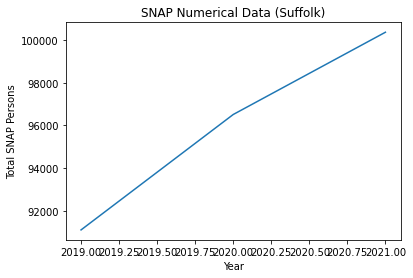

In [46]:
Suffolk_snap = storm.query("District == 'Suffolk'")
seaborn = sns.lineplot(data=Suffolk_snap, x="Year", y="Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Suffolk)")

Text(0.5, 1.0, 'SNAP Numerical Data (Westchester)')

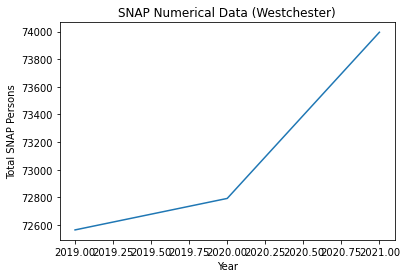

In [47]:
Westchester_snap = storm.query("District == 'Westchester'")
seaborn = sns.lineplot(data=Westchester_snap, x="Year", y="Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Westchester)")

Text(0.5, 1.0, 'Aggregate of New York State (SNAP Numerical Data)')

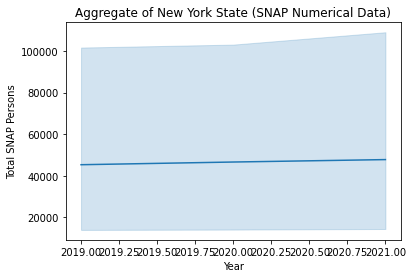

In [48]:
nysdata = sns.lineplot(data=storm, x="Year", y="Total SNAP Persons").set(title='Aggregate of New York State (SNAP Numerical Data)')
seaborn.set_title("Aggregate of New York State (SNAP Numerical Data)")

In [49]:
snap_population_state['District'].head(100)

0          Albany
1          Albany
2          Albany
3          Albany
4          Albany
5          Albany
6          Albany
7          Albany
8          Albany
9          Albany
10         Albany
11         Albany
12         Albany
13         Albany
14         Albany
15         Albany
16         Albany
17         Albany
18       Allegany
19       Allegany
20       Allegany
21       Allegany
22       Allegany
23       Allegany
24       Allegany
25       Allegany
26       Allegany
27       Allegany
28       Allegany
29       Allegany
30       Allegany
31       Allegany
32       Allegany
33       Allegany
34       Allegany
35       Allegany
36         Broome
37         Broome
38         Broome
39         Broome
40         Broome
41         Broome
42         Broome
43         Broome
44         Broome
45         Broome
46         Broome
47         Broome
48         Broome
49         Broome
50         Broome
51         Broome
52         Broome
53         Broome
54    Cattaraugus
55    Catt

In [50]:
snap_population_state.insert(2, "population", [21, 23, 24, 21], True)

ValueError: Length of values (4) does not match length of index (1566)

In [51]:
snap_population_state.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1566 entries, 0 to 1565
Data columns (total 18 columns):
 #   Column                                    Non-Null Count  Dtype 
---  ------                                    --------------  ----- 
 0   Unnamed: 0                                1566 non-null   int64 
 1   Unnamed: 0.1                              1566 non-null   int64 
 2   Unnamed: 0.1.1                            1566 non-null   int64 
 3   Unnamed: 0.1.1.1                          1566 non-null   int64 
 4   Year                                      1566 non-null   int64 
 5   Month                                     1566 non-null   object
 6   Month Code                                1566 non-null   int64 
 7   District Code                             1566 non-null   int64 
 8   District                                  1566 non-null   object
 9   Total SNAP Households                     1566 non-null   int64 
 10  Total SNAP Persons                        1566 n

In [120]:
conditions = [(snap_population_state['District']=='Erie') & ((snap_population_state['Year']=='2019')),
    (snap_population_state['District']=='Erie') & ((snap_population_state['Year']=='2020')),
    (snap_population_state['District']=='Erie') & ((snap_population_state['Year']=='2021')),
    (snap_population_state['District']=='Monroe') & ((snap_population_state['Year']=='2019')),
    (snap_population_state['District']=='Monroe') & ((snap_population_state['Year']=='2020')),
    (snap_population_state['District']=='Monroe') & ((snap_population_state['Year']=='2021')),
    (snap_population_state['District']=='Nassau') & ((snap_population_state['Year']=='2019')),
    (snap_population_state['District']=='Nassau') & ((snap_population_state['Year']=='2020')),
    (snap_population_state['District']=='Nassau') & ((snap_population_state['Year']=='2021')),
    (snap_population_state['District']=='Rockland') & ((snap_population_state['Year']=='2019')),
    (snap_population_state['District']=='Rockland') & ((snap_population_state['Year']=='2020')),
    (snap_population_state['District']=='Rockland') & ((snap_population_state['Year']=='2021')),
    (snap_population_state['District']=='Suffolk') & ((snap_population_state['Year']=='2019')),
    (snap_population_state['District']=='Suffolk') & ((snap_population_state['Year']=='2020')),
    (snap_population_state['District']=='Suffolk') & ((snap_population_state['Year']=='2021')),
    (snap_population_state['District']=='Westchester') & ((snap_population_state['Year']=='2019')),
    (snap_population_state['District']=='Westchester') & ((snap_population_state['Year']=='2020')),
    (snap_population_state['District']=='Westchester') & ((snap_population_state['Year']=='2021')),
    (snap_population_state['District']=='New York City') & ((snap_population_state['Year']=='2019')),
    (snap_population_state['District']=='New York City') & ((snap_population_state['Year']=='2020')),
    (snap_population_state['District']=='New York City') & ((snap_population_state['Year']=='2021'))]
# create a list of the values we want to assign for each condition
values2 = [918702,917687,916672,741770,740676,739582,1356920,1356310,1355700,325789,326056,326323,1476600,1472370,1468140,967506,966799,966092,8336817,8550971,8230290]

In [121]:
# create a new column and use np.select to assign values to it using our lists as arguments
snap_population_state['population'] = np.select(conditions, values2)
snap_population_state

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Year,Month,Month Code,District Code,District,Total SNAP Households,Total SNAP Persons,Total SNAP Benefits,Temporary Assistance SNAP Households,Temporary Assistance SNAP Persons,Temporary Assistance SNAP Benefits,Non-Temporary Assistance SNAP Households,Non-Temporary Assistance SNAP Persons,Non-Temporary Assistance SNAP Benefits,population
0,0,0,0,0,2020,June,6,1,Albany,19242,35151,5874893,5815,7657,1364683,13427,27494,4510210,0
1,1,1,1,1,2020,May,5,1,Albany,19063,34859,6131723,5851,7811,1430643,13212,27048,4701080,0
2,2,2,2,2,2020,April,4,1,Albany,18611,33675,7436275,5878,7825,1671893,12733,25850,5764382,0
3,3,3,3,3,2020,March,3,1,Albany,17514,31697,4000134,5808,7807,1179476,11706,23890,2820658,0
4,4,4,4,4,2020,February,2,1,Albany,17308,31290,3947807,5840,7904,1194948,11468,23386,2752859,0
5,5,5,5,5,2020,January,1,1,Albany,17464,31630,4000453,5951,8066,1224636,11513,23564,2775817,0
6,6,6,6,6,2019,December,12,1,Albany,17405,31658,4031722,5873,8022,1227758,11532,23636,2803964,0
7,7,7,7,7,2019,November,11,1,Albany,17431,31770,4042487,5906,8111,1236691,11525,23659,2805796,0
8,8,8,8,8,2019,October,10,1,Albany,17514,31762,4059097,5920,8132,1243373,11594,23630,2815724,0
9,9,9,9,9,2019,September,9,1,Albany,17474,31806,4007529,5922,8142,1229277,11552,23664,2778252,0


In [122]:
snap_population_state['%Total SNAP Persons']=snap_population_state['Total SNAP Persons']/snap_population_state['population']*100
snap_population_state

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Year,Month,Month Code,District Code,District,Total SNAP Households,Total SNAP Persons,Total SNAP Benefits,Temporary Assistance SNAP Households,Temporary Assistance SNAP Persons,Temporary Assistance SNAP Benefits,Non-Temporary Assistance SNAP Households,Non-Temporary Assistance SNAP Persons,Non-Temporary Assistance SNAP Benefits,population,%Total SNAP Persons
0,0,0,0,0,2020,June,6,1,Albany,19242,35151,5874893,5815,7657,1364683,13427,27494,4510210,0,inf
1,1,1,1,1,2020,May,5,1,Albany,19063,34859,6131723,5851,7811,1430643,13212,27048,4701080,0,inf
2,2,2,2,2,2020,April,4,1,Albany,18611,33675,7436275,5878,7825,1671893,12733,25850,5764382,0,inf
3,3,3,3,3,2020,March,3,1,Albany,17514,31697,4000134,5808,7807,1179476,11706,23890,2820658,0,inf
4,4,4,4,4,2020,February,2,1,Albany,17308,31290,3947807,5840,7904,1194948,11468,23386,2752859,0,inf
5,5,5,5,5,2020,January,1,1,Albany,17464,31630,4000453,5951,8066,1224636,11513,23564,2775817,0,inf
6,6,6,6,6,2019,December,12,1,Albany,17405,31658,4031722,5873,8022,1227758,11532,23636,2803964,0,inf
7,7,7,7,7,2019,November,11,1,Albany,17431,31770,4042487,5906,8111,1236691,11525,23659,2805796,0,inf
8,8,8,8,8,2019,October,10,1,Albany,17514,31762,4059097,5920,8132,1243373,11594,23630,2815724,0,inf
9,9,9,9,9,2019,September,9,1,Albany,17474,31806,4007529,5922,8142,1229277,11552,23664,2778252,0,inf


In [123]:
storm1 = snap_population_state.groupby(["District", "Year"])[["%Total SNAP Persons"]].mean()

Text(0.5, 1.0, 'SNAP Numerical Data (Erie)')

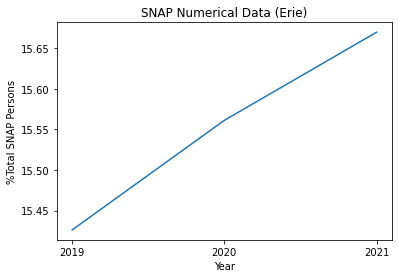

In [124]:
Erie_snap = storm1.query("District == 'Erie'")
seaborn = sns.lineplot(data=Erie_snap, x="Year", y="%Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Erie)")

Text(0.5, 1.0, 'SNAP Numerical Data (Monroe)')

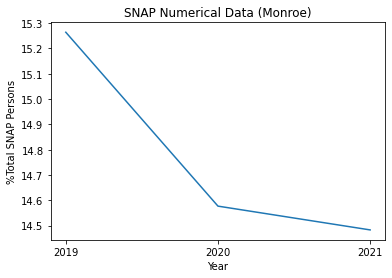

In [125]:
Monroe_snap = storm1.query("District == 'Monroe'")
seaborn = sns.lineplot(data=Monroe_snap, x="Year", y="%Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Monroe)")

Text(0.5, 1.0, 'SNAP Numerical Data (Rockland)')

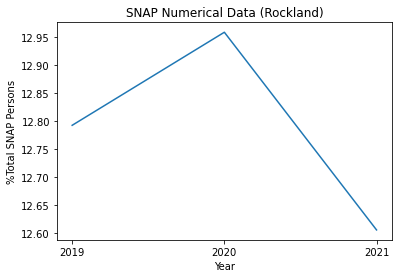

In [126]:
rockland_snap = storm1.query("District == 'Rockland'")
seaborn = sns.lineplot(data=rockland_snap, x="Year", y="%Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Rockland)")

In [ ]:
suffolk_snap = storm1.query("District == 'Suffolk'")
seaborn = sns.lineplot(data=suffolk_snap, x="Year", y="%Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Suffolk)")

In [ ]:
westchester_snap = storm1.query("District == 'Westchester'")
seaborn = sns.lineplot(data=westchester_snap, x="Year", y="%Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Westchester)")

In [ ]:
nassau_snap = storm1.query("District == 'Nassau'")
seaborn = sns.lineplot(data=nassau_snap, x="Year", y="%Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (Nassau)")

In [ ]:
nysnyc_snap = storm1.query("District == 'New York City'")
seaborn = sns.lineplot(data=nysnyc_snap, x="Year", y="%Total SNAP Persons")
seaborn.set_title("SNAP Numerical Data (New York City)")

In [ ]:
#values = [#Erie
    #918702, 917687, 916672,
          #Monroe
          #741770, 740676, 739582,
    #Nassau 
    #1356920, 1356310, 1355700,
    ##Rockland
   # 325789, 326056, 326323,
    #Suffolk
    #1476600, 1472370, 1468140,
    #Westchester
    #967506, 966799, 966092]

In [127]:
snap_population_state

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Year,Month,Month Code,District Code,District,Total SNAP Households,Total SNAP Persons,Total SNAP Benefits,Temporary Assistance SNAP Households,Temporary Assistance SNAP Persons,Temporary Assistance SNAP Benefits,Non-Temporary Assistance SNAP Households,Non-Temporary Assistance SNAP Persons,Non-Temporary Assistance SNAP Benefits,population,%Total SNAP Persons
0,0,0,0,0,2020,June,6,1,Albany,19242,35151,5874893,5815,7657,1364683,13427,27494,4510210,0,inf
1,1,1,1,1,2020,May,5,1,Albany,19063,34859,6131723,5851,7811,1430643,13212,27048,4701080,0,inf
2,2,2,2,2,2020,April,4,1,Albany,18611,33675,7436275,5878,7825,1671893,12733,25850,5764382,0,inf
3,3,3,3,3,2020,March,3,1,Albany,17514,31697,4000134,5808,7807,1179476,11706,23890,2820658,0,inf
4,4,4,4,4,2020,February,2,1,Albany,17308,31290,3947807,5840,7904,1194948,11468,23386,2752859,0,inf
5,5,5,5,5,2020,January,1,1,Albany,17464,31630,4000453,5951,8066,1224636,11513,23564,2775817,0,inf
6,6,6,6,6,2019,December,12,1,Albany,17405,31658,4031722,5873,8022,1227758,11532,23636,2803964,0,inf
7,7,7,7,7,2019,November,11,1,Albany,17431,31770,4042487,5906,8111,1236691,11525,23659,2805796,0,inf
8,8,8,8,8,2019,October,10,1,Albany,17514,31762,4059097,5920,8132,1243373,11594,23630,2815724,0,inf
9,9,9,9,9,2019,September,9,1,Albany,17474,31806,4007529,5922,8142,1229277,11552,23664,2778252,0,inf


In [128]:
snap_population_state.columns

Index(['Unnamed: 0', 'Unnamed: 0.1', 'Unnamed: 0.1.1', 'Unnamed: 0.1.1.1',
       'Year', 'Month', 'Month Code', 'District Code', 'District',
       'Total SNAP Households', 'Total SNAP Persons', 'Total SNAP Benefits',
       'Temporary Assistance SNAP Households',
       'Temporary Assistance SNAP Persons',
       'Temporary Assistance SNAP Benefits',
       'Non-Temporary Assistance SNAP Households',
       'Non-Temporary Assistance SNAP Persons',
       'Non-Temporary Assistance SNAP Benefits', 'population',
       '%Total SNAP Persons'],
      dtype='object')

In [129]:
conditions = [(snap_population_state['Year']=='2019'),
             (snap_population_state['Year']=='2020'),
             (snap_population_state['Year']=='2021')]
values = [0.23282713915462575,0.2394854361214381,0.24744896613110656]

In [130]:
snap_population_state['%nyspopulation'] = np.select(conditions, values)
snap_population_state

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Unnamed: 0.1.1.1,Year,Month,Month Code,District Code,District,Total SNAP Households,Total SNAP Persons,Total SNAP Benefits,Temporary Assistance SNAP Households,Temporary Assistance SNAP Persons,Temporary Assistance SNAP Benefits,Non-Temporary Assistance SNAP Households,Non-Temporary Assistance SNAP Persons,Non-Temporary Assistance SNAP Benefits,population,%Total SNAP Persons,%nyspopulation
0,0,0,0,0,2020,June,6,1,Albany,19242,35151,5874893,5815,7657,1364683,13427,27494,4510210,0,inf,0.239485
1,1,1,1,1,2020,May,5,1,Albany,19063,34859,6131723,5851,7811,1430643,13212,27048,4701080,0,inf,0.239485
2,2,2,2,2,2020,April,4,1,Albany,18611,33675,7436275,5878,7825,1671893,12733,25850,5764382,0,inf,0.239485
3,3,3,3,3,2020,March,3,1,Albany,17514,31697,4000134,5808,7807,1179476,11706,23890,2820658,0,inf,0.239485
4,4,4,4,4,2020,February,2,1,Albany,17308,31290,3947807,5840,7904,1194948,11468,23386,2752859,0,inf,0.239485
5,5,5,5,5,2020,January,1,1,Albany,17464,31630,4000453,5951,8066,1224636,11513,23564,2775817,0,inf,0.239485
6,6,6,6,6,2019,December,12,1,Albany,17405,31658,4031722,5873,8022,1227758,11532,23636,2803964,0,inf,0.232827
7,7,7,7,7,2019,November,11,1,Albany,17431,31770,4042487,5906,8111,1236691,11525,23659,2805796,0,inf,0.232827
8,8,8,8,8,2019,October,10,1,Albany,17514,31762,4059097,5920,8132,1243373,11594,23630,2815724,0,inf,0.232827
9,9,9,9,9,2019,September,9,1,Albany,17474,31806,4007529,5922,8142,1229277,11552,23664,2778252,0,inf,0.232827


In [131]:
snap_population_state = snap_population_state.drop('Unnamed: 0', 1)

In [132]:
snap_population_state = snap_population_state.drop('Unnamed: 0.1', 1)

In [133]:
snap_population_state = snap_population_state.drop('Unnamed: 0.1.1', 1)

In [134]:
snap_population_state = snap_population_state.drop('Unnamed: 0.1.1.1', 1)

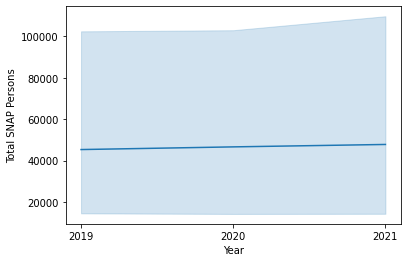

In [135]:
storm = snap_population_state.groupby(["District", "Year"])[["Total SNAP Persons"]].mean()
nysdata = sns.lineplot(data=storm, x="Year", y="Total SNAP Persons")

In [136]:
nys_storm = snap_population_state.groupby(["Year"])[["Total SNAP Persons"]].mean()
print(nys_storm)

      Total SNAP Persons
Year                    
2019        45293.169540
2020        46588.445402
2021        47757.603448


In [137]:
grouped_df = snap_population_state.groupby(["Year"])[["Total SNAP Persons"]]

In [138]:
grouped_and_summed = grouped_df.sum()
print(grouped_and_summed)

      Total SNAP Persons
Year                    
2019            31524046
2020            32425558
2021             8309823


In [139]:
data_nys = sns.lineplot(data=storm_nys, x="Year", y="Total SNAP Persons").set(title='Aggregate of New York State (SNAP Numerical Data)')
seaborn.set_title("Aggregate of New York State (SNAP Numerical Data)")

NameError: name 'storm_nys' is not defined

In [140]:
(45293.169540/19453561)*100

0.23282713915462575

In [141]:
(46588.445402/20201249)*100

0.23062160860449765

In [142]:
(47757.603448/19299981)*100

0.24744896613110656

Text(0.5, 1.0, 'Average of New York State (SNAP Numerical Data)')

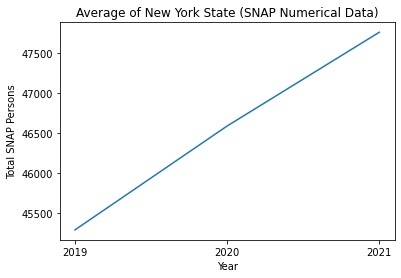

In [143]:
nysdata = sns.lineplot(data=nys_storm, x="Year", y="Total SNAP Persons").set(title='Average of New York State (SNAP Numerical Data)')
seaborn.set_title("Average of New York State (SNAP Numerical Data)")

In [144]:
nysstorm = snap_population_state.groupby(["Year"])[["%nyspopulation"]].mean()
print(nysstorm)

      %nyspopulation
Year                
2019        0.232827
2020        0.239485
2021        0.247449


Text(0.5, 1.0, 'Average Percentage of New York State (SNAP Numerical Data)')

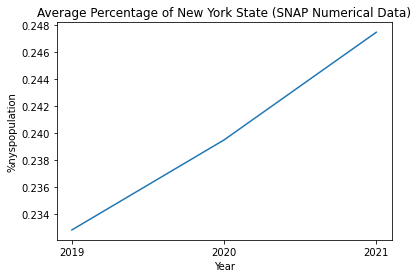

In [145]:
nys_data = sns.lineplot(data=nysstorm, x="Year", y="%nyspopulation").set(title='Average Percentage of New York State (SNAP Numerical Data)')
seaborn.set_title("Average Percentage of New York State (SNAP Numerical Data)")

In [ ]:
snap_population_state.to_csv('Supplemental_Nutrition_Assistance_Program__SNAP__Caseloads_and_Expenditures__Beginning_2002-4.csv', encoding='utf-8')